In [1]:
import itertools

import sys, os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cmx
import matplotlib.colors as colors
import seaborn as sns
import astropy.io.fits as pyfits
import re
import ctypes
import glob

%matplotlib inline

In [70]:
hdulist = pyfits.open('/Users/Sazbo/Desktop/Trivedi_Group/Analyzed/VIDYA_FINAL_RUN39_0271_25VF_r.fits')
hdulist40 = pyfits.open('/Users/Sazbo/Desktop/toAnalyze/VIDYA_FINAL_RUN39_0262_40VF_r.fits')
hdulist15 = pyfits.open('/Users/Sazbo/Desktop/toAnalyze/VIDYA_FINAL_RUN39_0287_15VF_r.fits')
hdulist35 = pyfits.open('/Users/Sazbo/Desktop/toAnalyze/VIDYA_FINAL_RUN39_0335_35VF_r.fits')
hdulist20 = pyfits.open('/Users/Sazbo/Desktop/toAnalyze/VIDYA_FINAL_RUN39_0224_20VF_r.fits')

In [9]:
susc = np.array( hdulist[26].data )
para_susc = np.array(hdulist[27].data)
bonds = np.array( hdulist['HoppingBonds'].data )
sites = np.array( hdulist['LatticeSiteOrdering'].data )
temperature = float(hdulist['PRIMARY'].header['HUBBARD MODEL K_BT'])
density_of_states = np.array(hdulist['DOS_1'].data)
idx_positive = np.argmin( np.abs( density_of_states['omega'] - 0.1 ) )
idx_negative = np.argmin( np.abs( density_of_states['omega'] + 0.1 ) )
sns.set_style('white')

KeyError: "Extension 'DisorderMap' not found."

In [4]:
temperature

0.01

In [5]:
hdulist[27].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                   64 / length of dimension 1                          
NAXIS2  =                 3200 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                    4 / number of table fields                         
HIERARCH PIPELINE CGS OMEGA = 0.1 / input/output frequency                      
HIERARCH PIPELINE CGS ETA = 0.01 / intrinsic broadening                         
HIERARCH PIPELINE CGS PROGRAM NAME = 'cgs.py  ' / Name of simulation program    
HIERARCH PIPELINE CGS PROGRAM VERSION = '1.0.0   ' / Version of simulation progr
HIERARCH PIPELINE CGS PROGRA

In [36]:
hdulist2 = pyfits.open('/Users/Sazbo/Desktop/toAnalyze/VIDYA_FINAL_RUN39_0328_35VF_r.fits')
hdulist2.info()

Filename: /Users/Sazbo/Desktop/toAnalyze/VIDYA_FINAL_RUN39_0328_35VF_r.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      95   ()      
  1  LDOS_1        1 ImageHDU        18   (40, 40, 1001)   float64   
  2  DOS_1         1 BinTableHDU     22   1001R x 2C   [D, D]   
  3  FinalPsiDownEigenstates_Real    1 ImageHDU         9   (40, 40, 3200)   float64   
  4  FinalPsiDownEigenstates_Imag    1 ImageHDU         9   (40, 40, 3200)   float64   
  5  FinalEigenvalues    1 BinTableHDU     12   3200R x 1C   [D]   
  6  FinalPsiUpEigenstates_Real    1 ImageHDU         9   (40, 40, 3200)   float64   
  7  FinalPsiUpEigenstates_Imag    1 ImageHDU         9   (40, 40, 3200)   float64   
  8  FinalSpinFlipMap_Imag    1 ImageHDU         8   (40, 40)   float64   
  9  FinalSpinFlipMap_Real    1 ImageHDU         8   (40, 40)   float64   
 10  FinalSpinDownMeanOccupancyMap    1 ImageHDU         8   (40, 40)   float64   
 11  FinalSpinUpMeanOccupan

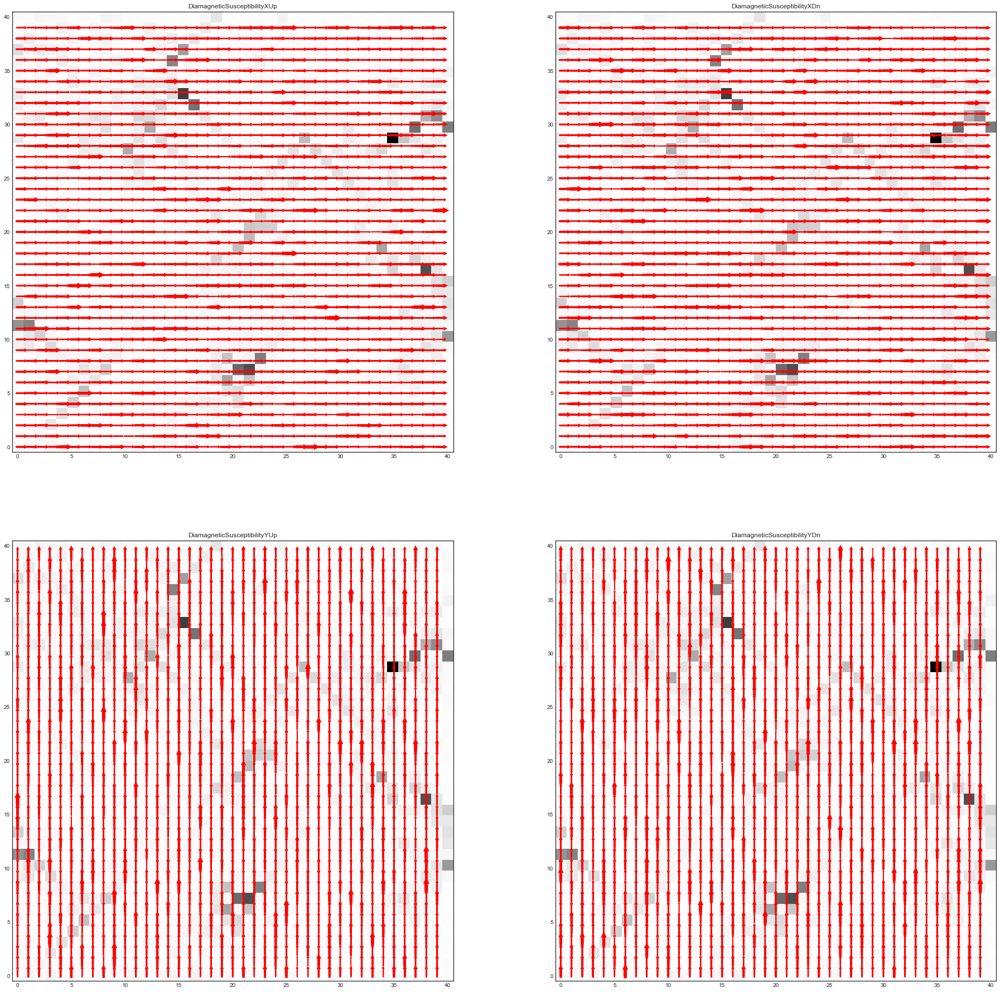

In [7]:
fig = plt.figure(figsize=(32,32))

for (idx, name) in enumerate(susc.dtype.names):
    maxchi1 = np.max(np.abs(susc[name]))

    ax = fig.add_subplot(2,2,idx+1)
    ax.set_title(name)
    zg = hdulist['LDOS_1'].data[idx_positive,:,::-1] + hdulist['LDOS_1'].data[idx_negative,:,::-1]
    ax.imshow(zg.T, origin='lower', extent=[-0.5, 40.5, -0.5, 40.5], cmap='Greys')
    
    
    cNorm  = colors.Normalize(vmin=np.min(np.abs(susc[name] / maxchi1)), vmax=np.max(np.abs(susc[name] / maxchi1)))
    scalarMap = cmx.ScalarMappable(norm=cNorm,cmap='RdBu')
    
    for b, chi in zip(bonds, susc[name]):
        rowsite = b[0]-1
        colsite = b[1]-1
        vec = np.array([b[3], b[4]])
        rowsite_coord = np.array([sites[rowsite]['b1'], sites[rowsite]['b2']])
        colsite_coord = rowsite_coord + vec

        #imag_chi = np.imag(chi)
        magnitude = np.abs(chi) / maxchi1
        
        colorVal = scalarMap.to_rgba(magnitude)
        
        if chi < 0:
            rowsite_coord, colsite_coord = colsite_coord, rowsite_coord

        arrow_start = rowsite_coord * 0.1 + colsite_coord * 0.9
        arrow_direction = 0.8 * (colsite_coord - rowsite_coord)
        
        ax.arrow(arrow_start[0], arrow_start[1], arrow_direction[0], arrow_direction[1],
                 head_width=min(0.3 * magnitude, 0.1),
                 head_length=min(0.3 * magnitude, 0.1),
                 linewidth=6 * magnitude,
                 fc='r',
                 ec='r')
        
    ax.set_xlim(-0.5, 40.5)
    ax.set_ylim(-0.5, 40.5)

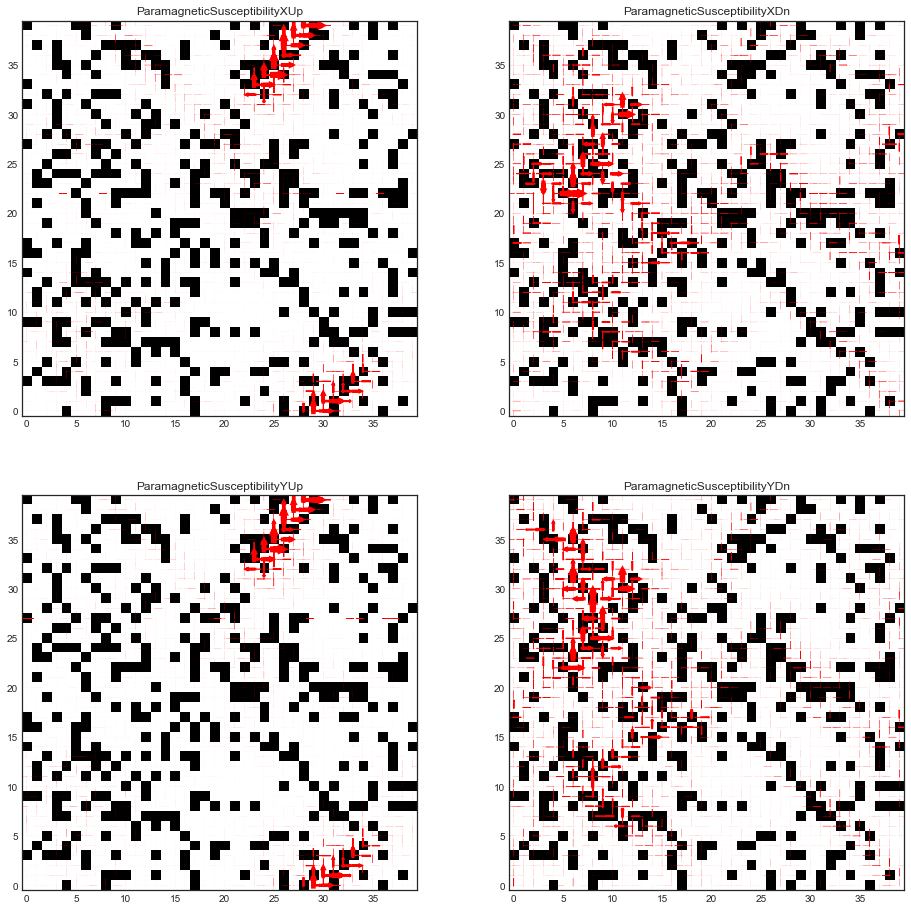

In [13]:
fig = plt.figure(figsize=(16,16))

for (idx, name) in enumerate(para_susc.dtype.names):
    maxchi = np.max(np.abs(np.imag(para_susc[name])))

    ax = fig.add_subplot(2,2,idx+1)
    ax.set_title(name)
    zg = np.abs(disorder_map)
    #hdulist['LDOS_1'].data[idx_positive,:,::-1] + hdulist['LDOS_1'].data[idx_negative,:,::-1]
    ax.imshow(zg, origin='lower', extent=[-0.5, 39.5, -0.5, 39.5], cmap='Greys')

    for b, chi in zip(bonds, para_susc[name]):
        rowsite = b[0]-1
        colsite = b[1]-1
        vec = np.array([b[3], b[4]])
        rowsite_coord = np.array([sites[rowsite]['b1'], sites[rowsite]['b2']])
        colsite_coord = rowsite_coord + vec

        imag_chi = np.imag(chi)
        magnitude = np.abs(np.imag(chi)) / maxchi

        if imag_chi < 0:
            rowsite_coord, colsite_coord = colsite_coord, rowsite_coord

        arrow_start = rowsite_coord * 0.1 + colsite_coord * 0.9
        arrow_direction = 0.8 * (colsite_coord - rowsite_coord)
        
        ax.arrow(arrow_start[0], arrow_start[1], arrow_direction[0], arrow_direction[1],
                 head_width=min(0.3 * magnitude, 0.1),
                 head_length=min(0.3 * magnitude, 0.1),
                 linewidth=6 * magnitude,
                 fc='r',
                 ec='r')
        
    ax.set_xlim(-0.5, 39.5)
    ax.set_ylim(-0.5, 39.5)
#fig.savefig('DisConSamplePlot_noT.png', dpi=300, bbox_inches='tight')

In [14]:
susc2 = np.array( hdulist2[27].data )
para_susc2 = np.array(hdulist2[28].data)
bonds2 = np.array( hdulist2['HoppingBonds'].data )
sites2 = np.array( hdulist2['LatticeSiteOrdering'].data )
density_of_states2 = np.array(hdulist2['DOS_1'].data)
idx_positive2 = np.argmin( np.abs( density_of_states2['omega'] - 0.1 ) )
idx_negative2 = np.argmin( np.abs( density_of_states2['omega'] + 0.1 ) )
disorder_map2 = np.array( hdulist2["OnSiteImpurityPotential"].data )
sns.set_style('white')

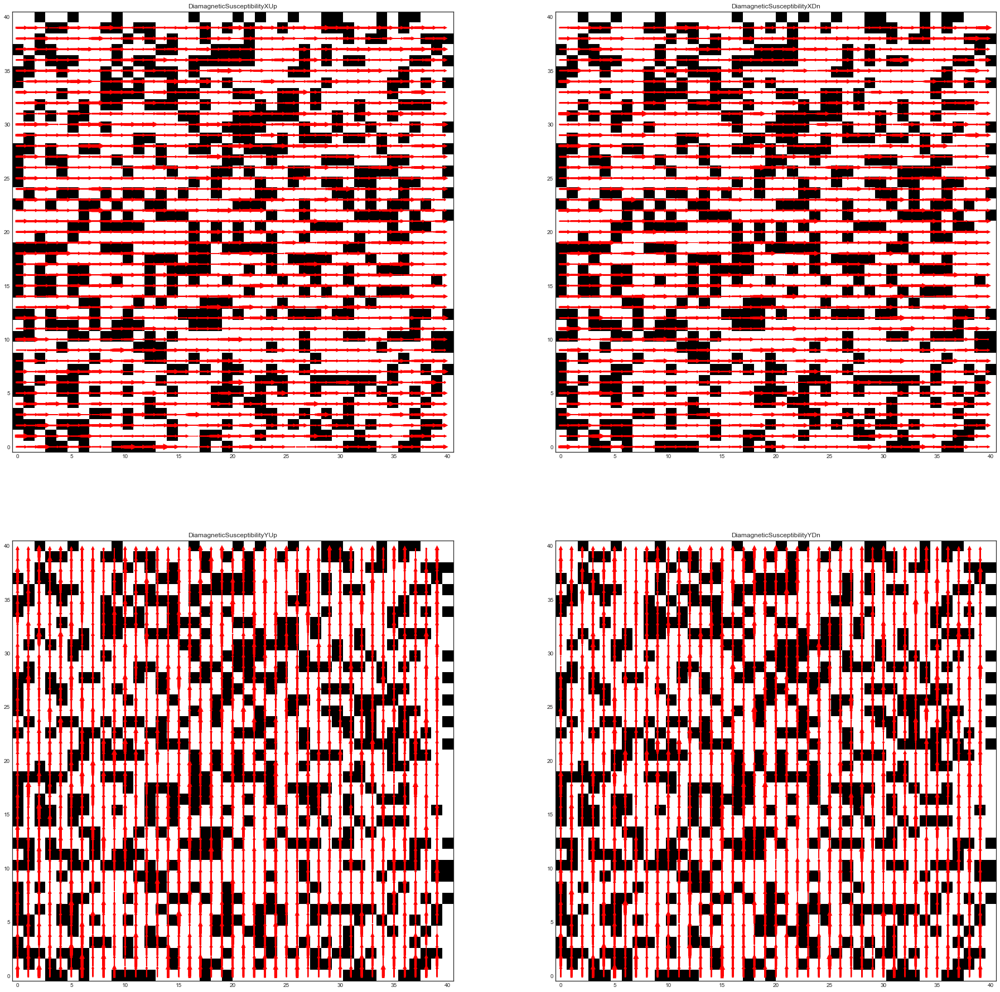

In [15]:
fig = plt.figure(figsize=(32,32))

for (idx, name) in enumerate(susc2.dtype.names):
    maxchi2 = np.max(np.abs(susc2[name]))
    avgchi2 = np.mean(susc2[name])
    ax = fig.add_subplot(2,2,idx+1)
    ax.set_title(name)
    ax.imshow(disorder_map2.T, origin='lower', extent=[-0.5, 40.5, -0.5, 40.5], cmap='Greys')
    for b, chi in zip(bonds2, susc2[name]):
        rowsite = b[0]-1
        colsite = b[1]-1
        vec = np.array([b[3], b[4]])
        rowsite_coord = np.array([sites2[rowsite]['b1'], sites2[rowsite]['b2']])
        colsite_coord = rowsite_coord + vec

        #imag_chi = np.imag(chi)
        magnitude = np.abs(chi) / maxchi2

        if (chi) < 0:
            rowsite_coord, colsite_coord = colsite_coord, rowsite_coord

        arrow_start = rowsite_coord * 0.1 + colsite_coord * 0.9
        arrow_direction = 0.8 * (colsite_coord - rowsite_coord)
        
        ax.arrow(arrow_start[0], arrow_start[1], arrow_direction[0], arrow_direction[1],
                 head_width=min(0.3 * magnitude, 0.1),
                 head_length=min(0.3 * magnitude, 0.1),
                 linewidth=6 * magnitude,
                 fc='r',
                 ec='r')
        
    ax.set_xlim(-0.5, 40.5)
    ax.set_ylim(-0.5, 40.5)

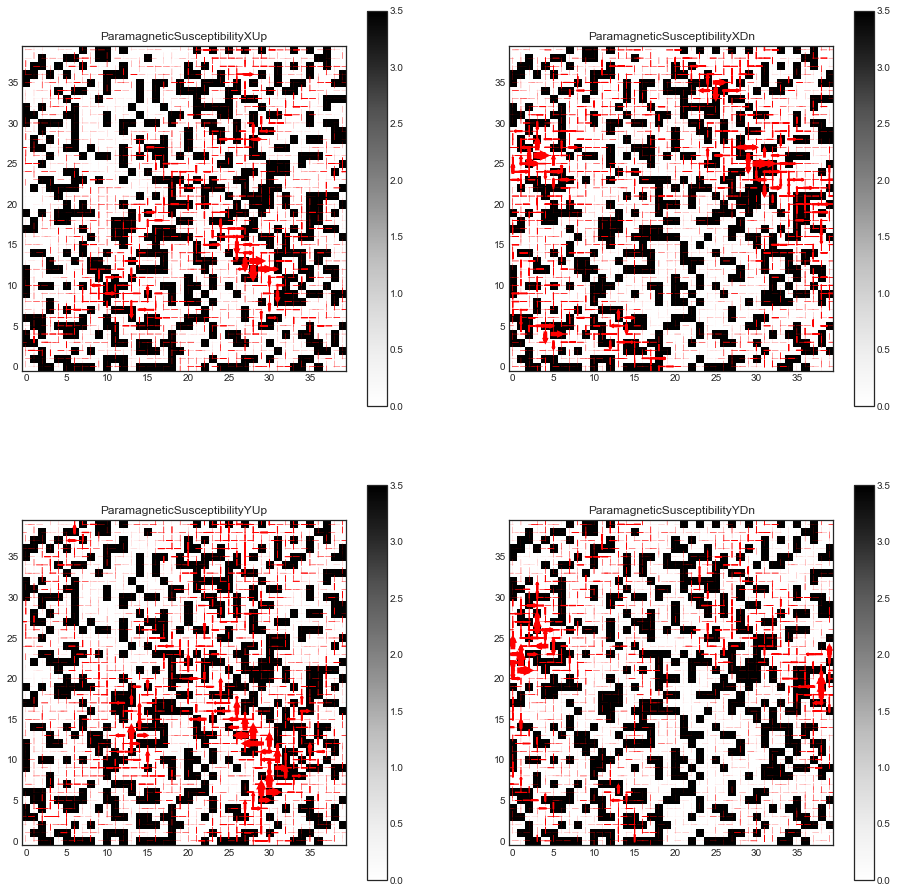

In [16]:
fig = plt.figure(figsize=(16,16))

for (idx, name) in enumerate(para_susc2.dtype.names):
    maxchi = np.max(np.abs(np.imag(para_susc2[name])))

    ax = fig.add_subplot(2,2,idx+1)
    ax.set_title(name)
    zg = disorder_map2
    #zg = hdulist2['LDOS_1'].data[idx_positive2,:,::-1] + hdulist2['LDOS_1'].data[idx_negative2,:,::-1]
    im = ax.imshow(zg, origin='lower', extent=[-0.5, 39.5, -0.5, 39.5], cmap='Greys')
    fig.colorbar(im)
    for b, chi in zip(bonds2, para_susc2[name]):
        rowsite = b[0]-1
        colsite = b[1]-1
        vec = np.array([b[3], b[4]])
        rowsite_coord = np.array([sites[rowsite]['b1'], sites[rowsite]['b2']])
        colsite_coord = rowsite_coord + vec

        imag_chi = np.imag(chi)
        magnitude = np.abs(np.imag(chi)) / maxchi

        if imag_chi < 0:
            rowsite_coord, colsite_coord = colsite_coord, rowsite_coord

        arrow_start = rowsite_coord * 0.1 + colsite_coord * 0.9
        arrow_direction = 0.8 * (colsite_coord - rowsite_coord)
        
        ax.arrow(arrow_start[0], arrow_start[1], arrow_direction[0], arrow_direction[1],
                 head_width=min(0.3 * magnitude, 0.1),
                 head_length=min(0.3 * magnitude, 0.1),
                 linewidth=6 * magnitude,
                 fc='r',
                 ec='r')
        
    ax.set_xlim(-0.5, 39.5)
    ax.set_ylim(-0.5, 39.5)
#fig.savefig('DisConSamplePlot_noT.png', dpi=300, bbox_inches='tight')

In [11]:
eigenvalues = hdulist['FinalEigenvalues'].data['Eigenvalues']
eigenvectors_up = hdulist["FinalPsiUpEigenstates_Real"].data + 1j * hdulist["FinalPsiUpEigenstates_Imag"].data
eigenvectors_down = hdulist["FinalPsiDownEigenstates_Real"].data + 1j * hdulist["FinalPsiDownEigenstates_Imag"].data

eigenvalues2 = hdulist2['FinalEigenvalues'].data['Eigenvalues']
eigenvectors_up2 = hdulist2["FinalPsiUpEigenstates_Real"].data + 1j * hdulist2["FinalPsiUpEigenstates_Imag"].data
eigenvectors_down2 = hdulist2["FinalPsiDownEigenstates_Real"].data + 1j * hdulist2["FinalPsiDownEigenstates_Imag"].data

In [12]:
fermiDirac = lambda e: 1.0 / (np.exp(e / 0.01) + 1.0)

up_occupancy = np.zeros((40, 40), dtype=np.float64)
for idx_eigen in range(len(eigenvalues)):
    up_occupancy += fermiDirac(eigenvalues[idx_eigen]) * np.abs(eigenvectors_up[idx_eigen, :, :])**2
    
down_occupancy = np.zeros((40, 40), dtype=np.float64)
for idx_eigen in range(len(eigenvalues)):
    down_occupancy += fermiDirac(eigenvalues[idx_eigen]) * np.abs(eigenvectors_down[idx_eigen, :, :])**2
    
up_occupancy2 = np.zeros((40, 40), dtype=np.float64)
for idx_eigen in range(len(eigenvalues)):
    up_occupancy2 += fermiDirac(eigenvalues2[idx_eigen]) * np.abs(eigenvectors_up2[idx_eigen, :, :])**2
    
down_occupancy2 = np.zeros((40, 40), dtype=np.float64)
for idx_eigen in range(len(eigenvalues)):
    down_occupancy2 += fermiDirac(eigenvalues2[idx_eigen]) * np.abs(eigenvectors_down2[idx_eigen, :, :])**2
    
disorder_map = np.array( hdulist["OnSiteImpurityPotential"].data )
spin_up_map = np.array(hdulist["FinalSpinUpMeanOccupancyMap"].data)
spin_dn_map = np.array(hdulist["FinalSpinDownMeanOccupancyMap"].data)

disorder_map2 = np.array( hdulist2["OnSiteImpurityPotential"].data )
spin_up_map2 = np.array(hdulist2["FinalSpinUpMeanOccupancyMap"].data)
spin_dn_map2 = np.array(hdulist2["FinalSpinDownMeanOccupancyMap"].data)

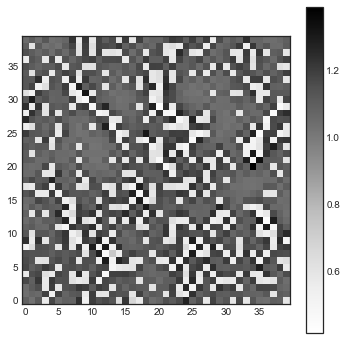

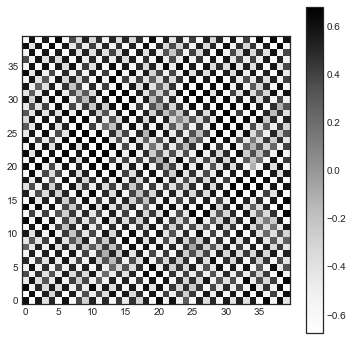

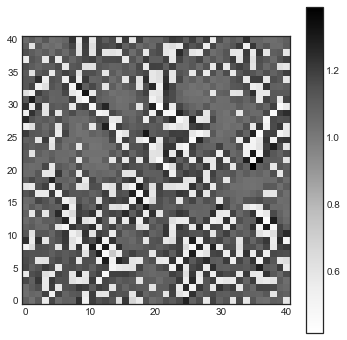

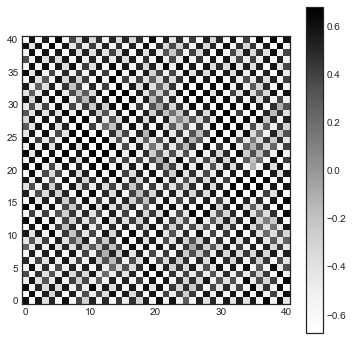

In [17]:
plt.figure(figsize=(6,6))
plt.imshow(up_occupancy.T + down_occupancy.T, origin='lower', cmap='Greys')
plt.colorbar()

plt.figure(figsize=(6,6))
plt.imshow(up_occupancy.T - down_occupancy.T, origin='lower', cmap='Greys')
plt.colorbar()

plt.figure(figsize=(6,6))
#plt.imshow(disorder_map.T, origin='lower', extent=[-0.5, 35.5, -0.5, 35.5])
#plt.colorbar()
plt.figure(figsize=(6,6))
plt.imshow((spin_up_map + spin_dn_map).T, origin='lower', extent=[-0.5, 40.5, -0.5, 40.5], cmap='Greys')
plt.colorbar()
plt.figure(figsize=(6,6))
plt.imshow((spin_up_map - spin_dn_map).T, origin='lower', extent=[-0.5, 40.5, -0.5, 40.5], cmap='Greys')
plt.colorbar()

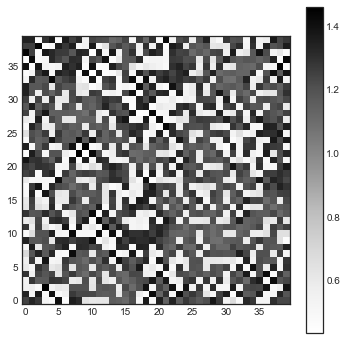

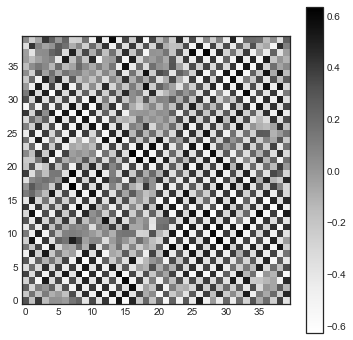

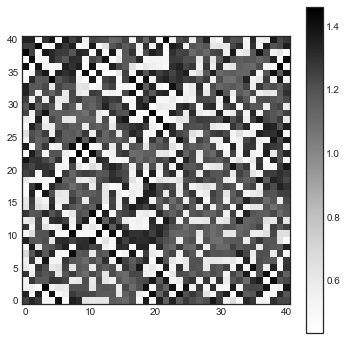

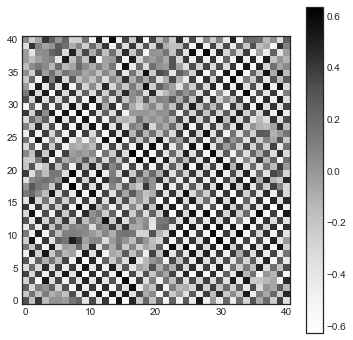

In [18]:
plt.figure(figsize=(6,6))
plt.imshow(up_occupancy2.T + down_occupancy2.T, origin='lower', cmap='Greys')
plt.colorbar()

plt.figure(figsize=(6,6))
plt.imshow(up_occupancy2.T - down_occupancy2.T, origin='lower', cmap='Greys')
plt.colorbar()

plt.figure(figsize=(6,6))
#plt.imshow(disorder_map.T, origin='lower', extent=[-0.5, 35.5, -0.5, 35.5])
#plt.colorbar()
plt.figure(figsize=(6,6))
plt.imshow((spin_up_map2 + spin_dn_map2).T, origin='lower', extent=[-0.5, 40.5, -0.5, 40.5], cmap='Greys')
plt.colorbar()
plt.figure(figsize=(6,6))
plt.imshow((spin_up_map2 - spin_dn_map2).T, origin='lower', extent=[-0.5, 40.5, -0.5, 40.5], cmap='Greys')
plt.colorbar()

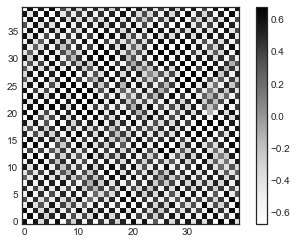

In [19]:
plt.imshow((up_occupancy.T - down_occupancy.T), origin='lower', cmap='Greys')
plt.colorbar()

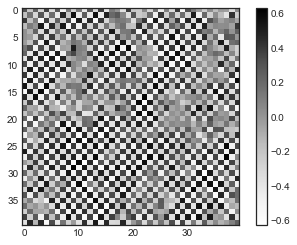

In [20]:
plt.imshow((up_occupancy2 - down_occupancy2), cmap='Greys')
plt.colorbar()

In [21]:
diagUp_real = susc2['DiamagneticSusceptibilityXUp'] + susc2['DiamagneticSusceptibilityYUp'];
diagDn_real = susc2['DiamagneticSusceptibilityXDn'] + susc2['DiamagneticSusceptibilityYDn'];

diagUp_real1 = susc['DiamagneticSusceptibilityXUp'] + susc['DiamagneticSusceptibilityYUp'];
diagDn_real1 = susc['DiamagneticSusceptibilityXDn'] + susc['DiamagneticSusceptibilityYDn'];

diag_real1 = diagDn_real1 + diagUp_real1;
diag_real = diagUp_real + diagDn_real;

para2test = para_susc2['ParamagneticSusceptibilityXUp'];

para2x = para_susc2['ParamagneticSusceptibilityXUp'] + para_susc2['ParamagneticSusceptibilityXDn'];
para2y = para_susc2['ParamagneticSusceptibilityYUp'] + para_susc2['ParamagneticSusceptibilityYDn'];

parax = para_susc['ParamagneticSusceptibilityXUp'] + para_susc['ParamagneticSusceptibilityXDn'];
paray = para_susc['ParamagneticSusceptibilityYUp'] + para_susc['ParamagneticSusceptibilityYDn'];

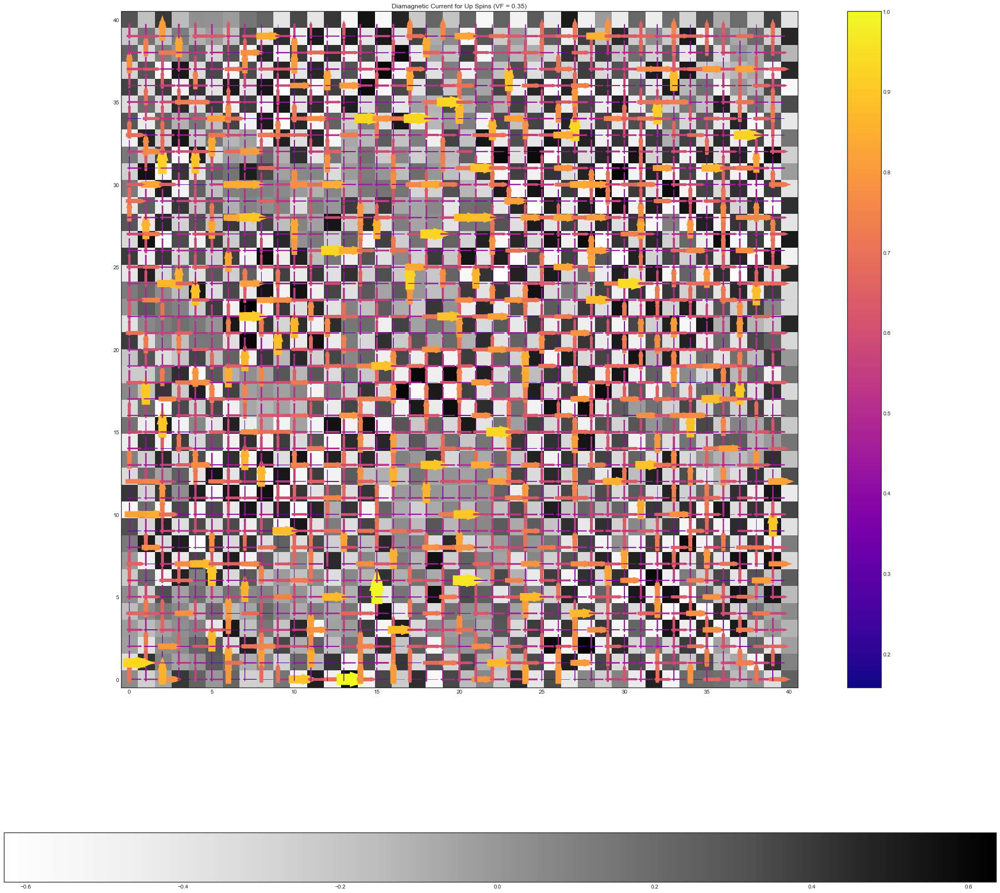

In [22]:
maxchi2Up = np.max(np.abs(diagUp_real))

fig = plt.figure(figsize=(32,32))
ax = fig.add_subplot(1,1,1)
im = ax.imshow((up_occupancy2.T - down_occupancy2.T), extent=[-0.5, 40.5, -0.5, 40.5], cmap='Greys')
fig.colorbar(im, orientation='horizontal')
#ax.imshow(zg.T, origin='lower', extent=[-0.5, 40.5, -0.5, 40.5], cmap='Greys')
    
cmap = plt.cm.plasma   
cNorm  = colors.Normalize(vmin=np.min(np.abs(diagUp_real / maxchi2Up)), vmax=np.max(np.abs(diagUp_real / maxchi2Up)))
scalarMap = cmx.ScalarMappable(norm=cNorm,cmap=cmap)

scalarMap.set_array(np.abs(diagUp_real / maxchi2Up))

for b, chi in zip(bonds2, diagUp_real):
        rowsite = b[0]-1
        colsite = b[1]-1
        vec = np.array([b[3], b[4]])
        rowsite_coord = np.array([sites[rowsite]['b1'], sites[rowsite]['b2']])
        colsite_coord = rowsite_coord + vec
        
        magnitude = np.abs(chi) / maxchi2Up
        
        colorVal = scalarMap.to_rgba(magnitude)
        
        if chi < 0:
            rowsite_coord, colsite_coord = colsite_coord, rowsite_coord

        arrow_start = rowsite_coord * 0.1 + colsite_coord * 0.9
        arrow_direction = 0.8 * (colsite_coord - rowsite_coord)
        
        #if magnitude < 0.5:
        #    magnitude = 0;
        
        ax.arrow(arrow_start[0], arrow_start[1], arrow_direction[0], arrow_direction[1],
                 #head_width=min(0.3 * magnitude, 0.1),
                 #head_length=min(0.3 * magnitude, 0.1),
                 linewidth= 20 * magnitude**3,
                 color = colorVal)
        
ax.set_xlim(-0.5, 40.5)
ax.set_ylim(-0.5, 40.5)
ax.set_title('Diamagnetic Current for Up Spins (VF = 0.35)')
fig.colorbar(scalarMap)

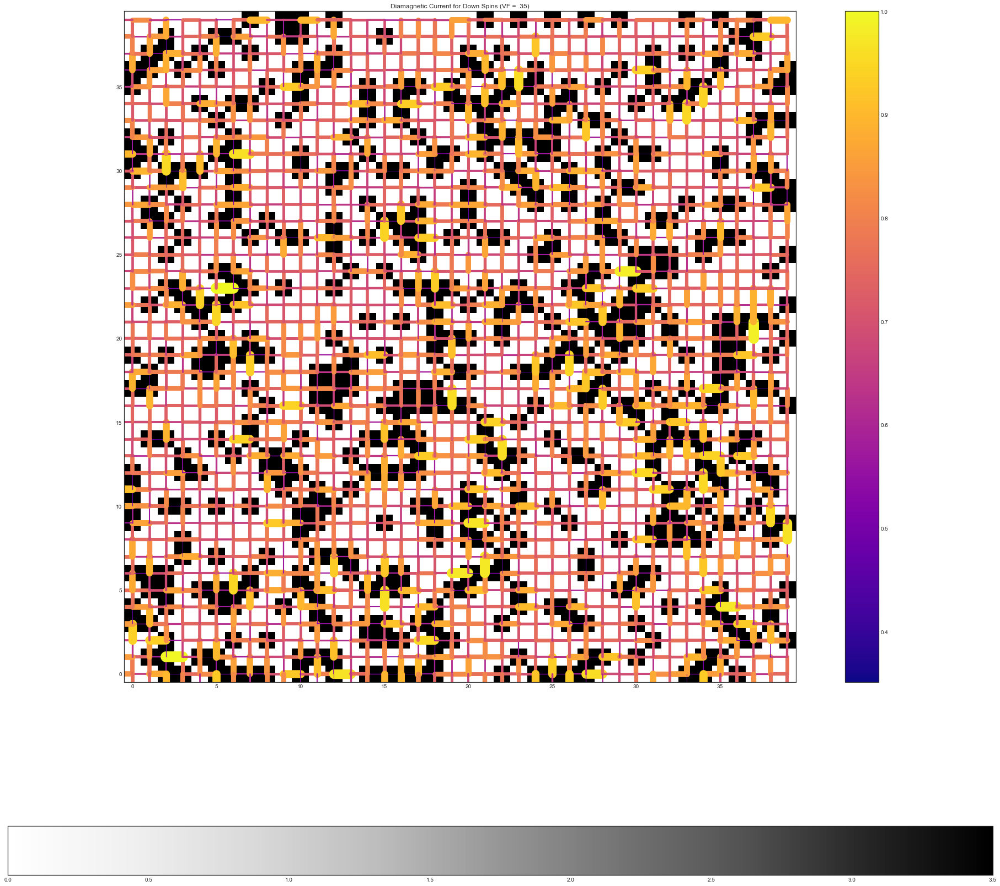

In [23]:
maxchi2Dn = np.max(np.abs(diag_real))

fig = plt.figure(figsize=(32,32))
ax = fig.add_subplot(1,1,1)
im = ax.imshow(np.abs(disorder_map2), origin='lower', extent=[-0.5, 39.5, -0.5, 39.5], cmap='Greys')
fig.colorbar(im, orientation='horizontal')
    
cmap = plt.cm.plasma   
cNorm  = colors.Normalize(vmin=np.min(np.abs(diag_real / maxchi2Dn)), vmax=np.max(np.abs(diag_real / maxchi2Dn)))
scalarMap = cmx.ScalarMappable(norm=cNorm,cmap=cmap)

scalarMap.set_array(np.abs(diag_real / maxchi2Dn))

for b, chi in zip(bonds2, diag_real):
        rowsite = b[0]-1
        colsite = b[1]-1
        vec = np.array([b[3], b[4]])
        rowsite_coord = np.array([sites[rowsite]['b1'], sites[rowsite]['b2']])
        colsite_coord = rowsite_coord + vec
        
        magnitude = np.abs(chi) / maxchi2Dn
        
        colorVal = scalarMap.to_rgba(magnitude)
        
        if chi < 0:
            rowsite_coord, colsite_coord = colsite_coord, rowsite_coord

        arrow_start = rowsite_coord * 0.1 + colsite_coord * 0.9
        arrow_direction = 0.8 * (colsite_coord - rowsite_coord)
        
        ax.plot([rowsite_coord[0], colsite_coord[0]], 
                [rowsite_coord[1], colsite_coord[1]],
                linewidth=20.*magnitude**4,
                color=colorVal,
                )
        
ax.set_xlim(-0.5, 39.5)
ax.set_ylim(-0.5, 39.5)
ax.set_title('Diamagnetic Current for Down Spins (VF = .35)')
fig.colorbar(scalarMap)

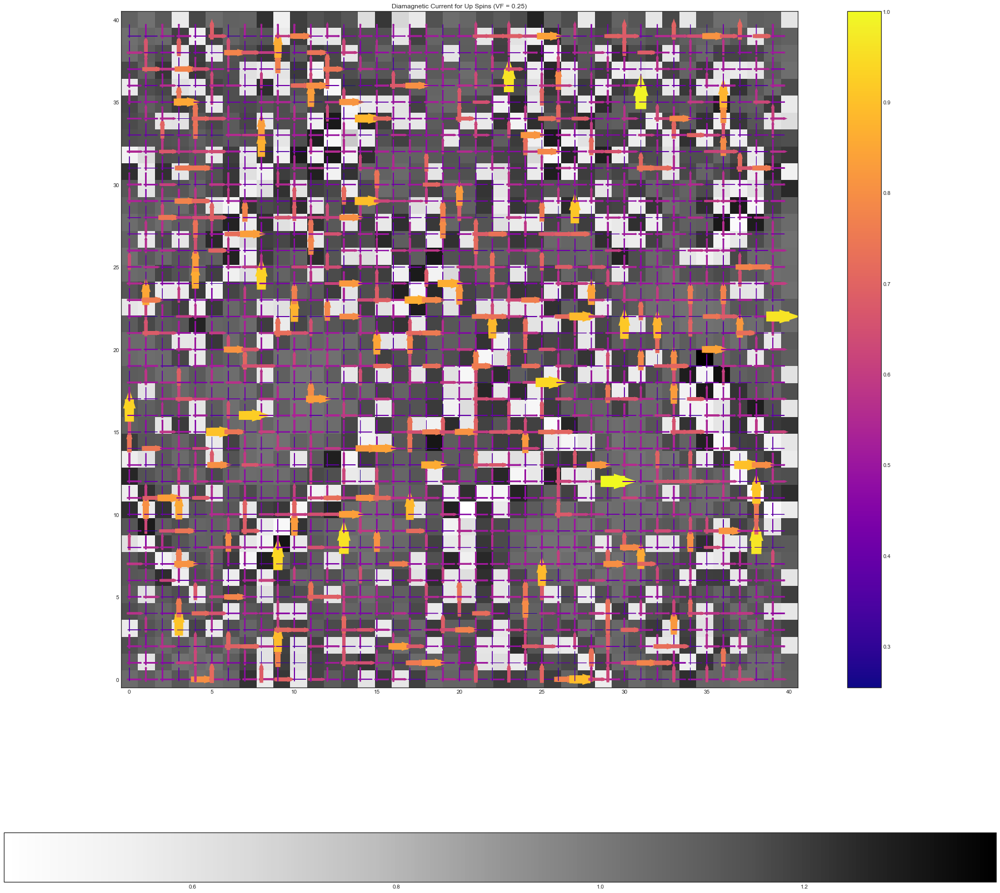

In [24]:
maxchi2Up = np.max(np.abs(diagUp_real1))

fig = plt.figure(figsize=(32,32))
ax = fig.add_subplot(1,1,1)
im = ax.imshow((up_occupancy.T + down_occupancy.T), extent=[-0.5, 40.5, -0.5, 40.5], cmap='Greys')
fig.colorbar(im, orientation='horizontal')
#ax.imshow(zg.T, origin='lower', extent=[-0.5, 40.5, -0.5, 40.5], cmap='Greys')
    
cmap = plt.cm.plasma   
cNorm  = colors.Normalize(vmin=np.min(np.abs(diagUp_real1 / maxchi2Up)), vmax=np.max(np.abs(diagUp_real1 / maxchi2Up)))
scalarMap = cmx.ScalarMappable(norm=cNorm,cmap=cmap)

scalarMap.set_array(np.abs(diagUp_real1 / maxchi2Up))

for b, chi in zip(bonds2, diagUp_real1):
        rowsite = b[0]-1
        colsite = b[1]-1
        vec = np.array([b[3], b[4]])
        rowsite_coord = np.array([sites[rowsite]['b1'], sites[rowsite]['b2']])
        colsite_coord = rowsite_coord + vec
        
        magnitude = np.abs(chi) / maxchi2Up
        
        colorVal = scalarMap.to_rgba(magnitude)
        
        if chi < 0:
            rowsite_coord, colsite_coord = colsite_coord, rowsite_coord

        #if magnitude < 0.5:
        #    magnitude = 0;
            
        
        arrow_start = rowsite_coord * 0.1 + colsite_coord * 0.9
        arrow_direction = 0.8 * (colsite_coord - rowsite_coord)
        
        ax.arrow(arrow_start[0], arrow_start[1], arrow_direction[0], arrow_direction[1],
                 #head_width=min(0.3 * magnitude, 0.1),
                 #head_length=min(0.3 * magnitude, 0.1),
                 linewidth= 20 * magnitude**3,
                 color = colorVal)
        
ax.set_xlim(-0.5, 40.5)
ax.set_ylim(-0.5, 40.5)
ax.set_title('Diamagnetic Current for Up Spins (VF = 0.25)')
fig.colorbar(scalarMap)

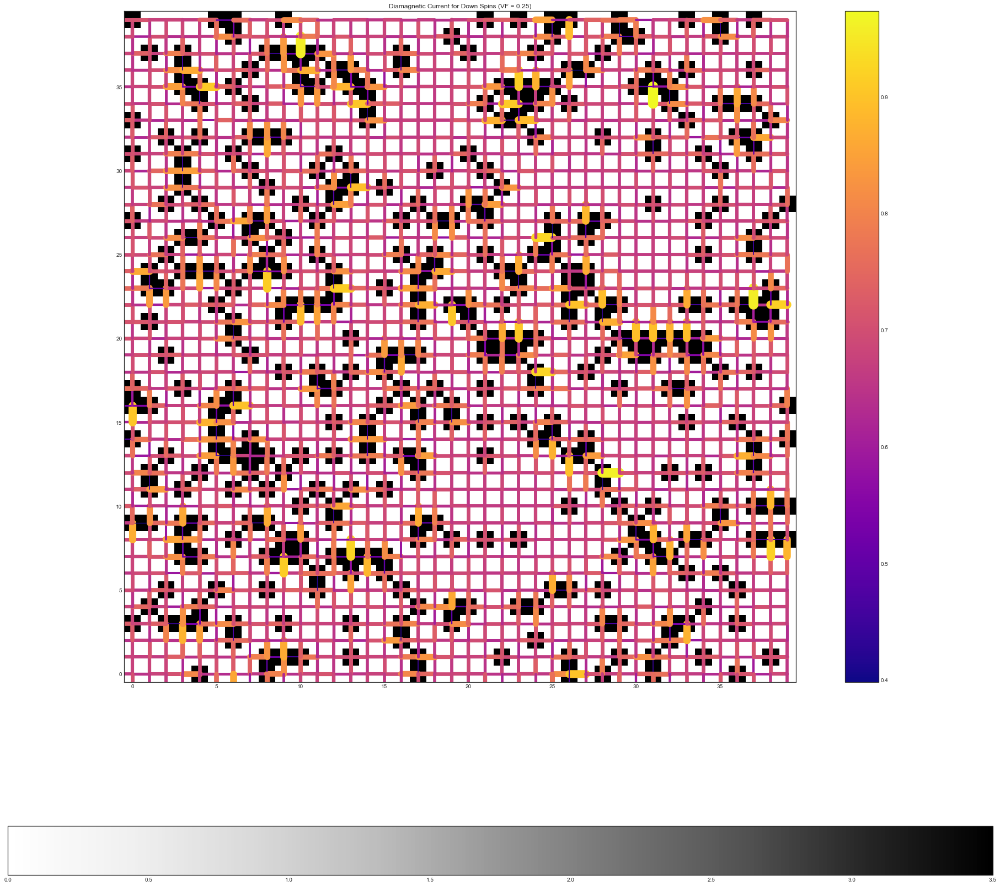

In [25]:
maxchi2Dn = 1;
#np.max(np.abs(diag_real1))

fig = plt.figure(figsize=(32,32))
ax = fig.add_subplot(1,1,1)
im = ax.imshow(np.abs(disorder_map), origin='lower', extent=[-0.5, 39.5, -0.5, 39.5], cmap='Greys')
fig.colorbar(im, orientation='horizontal')
#ax.imshow(zg.T, origin='lower', extent=[-0.5, 40.5, -0.5, 40.5], cmap='Greys')
    
cmap = plt.cm.plasma   
cNorm  = colors.Normalize(vmin=np.min(np.abs(diag_real1 / maxchi2Dn)), vmax=np.max(np.abs(diag_real1 / maxchi2Dn)))
scalarMap = cmx.ScalarMappable(norm=cNorm,cmap=cmap)

scalarMap.set_array(np.abs(diag_real1 / maxchi2Dn))

ax.set_xlim(-0.5, 39.5)
ax.set_ylim(-0.5, 39.5)

for b, chi in zip(bonds2, diag_real1):
        rowsite = b[0]-1
        colsite = b[1]-1
        vec = np.array([b[3], b[4]])
        rowsite_coord = np.array([sites[rowsite]['b1'], sites[rowsite]['b2']])
        colsite_coord = rowsite_coord + vec
        
        magnitude = np.abs(chi) / maxchi2Dn
        
        colorVal = scalarMap.to_rgba(magnitude)
        
        if chi < 0:
            rowsite_coord, colsite_coord = colsite_coord, rowsite_coord

        arrow_direction = 1.0 * (colsite_coord - rowsite_coord)
        arrow_start = rowsite_coord * 0.1 + colsite_coord * 0.9
        
        #print (arrow_start[0], arrow_start[1])
        ax.plot([rowsite_coord[0], colsite_coord[0]], 
                [rowsite_coord[1], colsite_coord[1]],
                linewidth=20.*magnitude**3,
                color=colorVal,
                )
        

ax.set_title('Diamagnetic Current for Down Spins (VF = 0.25)')
fig.colorbar(scalarMap)

In [26]:
np.max(np.abs(diag_real))

0.96829087305951878

In [27]:
local_DOS.shape

NameError: name 'local_DOS' is not defined

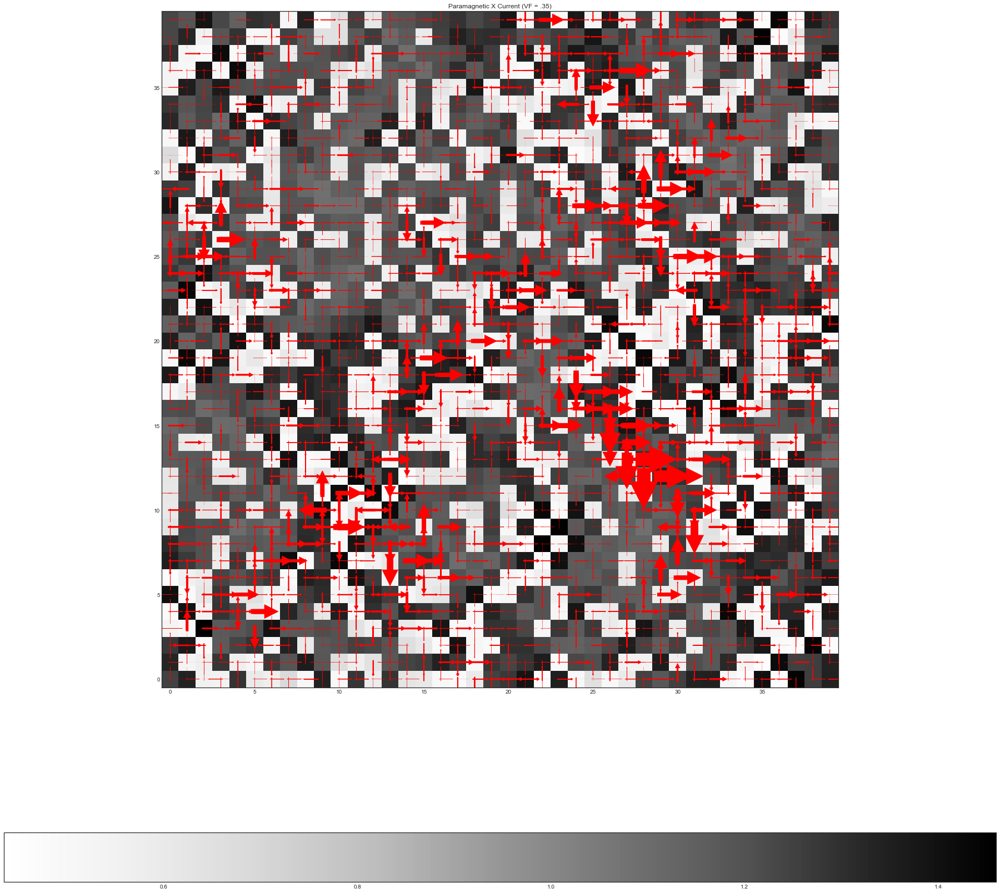

In [28]:
maxchi = np.max(np.abs(np.imag(para2x)))

fig = plt.figure(figsize=(32,32))
ax = fig.add_subplot(1,1,1)
im = ax.imshow((up_occupancy2 + down_occupancy2), origin='lower', extent=[-0.5, 39.5, -0.5, 39.5], cmap='Greys')
fig.colorbar(im, orientation='horizontal')
    
#cmap = plt.cm.plasma   
#cNorm  = colors.Normalize(vmin=np.min(np.abs(diag_real / maxchi2Dn)), vmax=np.max(np.abs(diag_real / maxchi2Dn)))
#scalarMap = cmx.ScalarMappable(norm=cNorm,cmap=cmap)

#scalarMap.set_array(np.abs(diag_real / maxchi2Dn))

for b, chi in zip(bonds2, para2x):
        rowsite = b[0]-1
        colsite = b[1]-1
        vec = np.array([b[3], b[4]])
        rowsite_coord = np.array([sites[rowsite]['b1'], sites[rowsite]['b2']])
        colsite_coord = rowsite_coord + vec
        
        imag_chi = np.imag(chi)
        magnitude = np.abs(np.imag(chi)) / maxchi

        if imag_chi < 0:
            rowsite_coord, colsite_coord = colsite_coord, rowsite_coord
        
        #colorVal = scalarMap.to_rgba(magnitude)
        

        arrow_start = rowsite_coord * 0.1 + colsite_coord * 0.9
        arrow_direction = 0.8 * (colsite_coord - rowsite_coord)
        
        ax.arrow(arrow_start[0], arrow_start[1], arrow_direction[0], arrow_direction[1],
                 head_width=min(1.2 * magnitude, 0.4),
                 head_length=min(1.2 * magnitude, 0.4),
                 linewidth= 24 * magnitude,
                 fc='r',
                 ec='r')
        
ax.set_xlim(-0.5, 39.5)
ax.set_ylim(-0.5, 39.5)
ax.set_title('Paramagnetic X Current (VF = .35)')
#fig.colorbar(scalarMap)

In [30]:
maxchi = np.max(np.abs(np.imag(para_susc2[name])))

ax = fig.add_subplot(2,2,idx+1)
ax.set_title(name)
zg = disorder_map2
#zg = hdulist2['LDOS_1'].data[idx_positive2,:,::-1] + hdulist2['LDOS_1'].data[idx_negative2,:,::-1]
im = ax.imshow(zg, origin='lower', extent=[-0.5, 39.5, -0.5, 39.5], cmap='Greys')
fig.colorbar(im)
for b, chi in zip(bonds2, para_susc2[name]):
    rowsite = b[0]-1
    colsite = b[1]-1
    vec = np.array([b[3], b[4]])
    rowsite_coord = np.array([sites[rowsite]['b1'], sites[rowsite]['b2']])
    colsite_coord = rowsite_coord + vec

    imag_chi = np.imag(chi)
    magnitude = np.abs(np.imag(chi)) / maxchi

    if imag_chi < 0:
        rowsite_coord, colsite_coord = colsite_coord, rowsite_coord

    arrow_start = rowsite_coord * 0.1 + colsite_coord * 0.9
    arrow_direction = 0.8 * (colsite_coord - rowsite_coord)
        
    ax.arrow(arrow_start[0], arrow_start[1], arrow_direction[0], arrow_direction[1],
        head_width=min(0.3 * magnitude, 0.1),
        head_length=min(0.3 * magnitude, 0.1),
        linewidth=6 * magnitude,
        fc='r',
        ec='r')

In [31]:
def computeDiaSusc(filename):
    assert type(filename) == str;
    fits_file = pyfits.open(filename)
    
    hopping_bonds = np.ascontiguousarray(fits_file['HoppingBonds'].data)
    rowsites = np.ascontiguousarray(hopping_bonds['RowSite'], dtype=ctypes.c_int)
    colsites = np.ascontiguousarray(hopping_bonds['ColSite'], dtype=ctypes.c_int)
    amplitudes = np.ascontiguousarray(hopping_bonds['Amplitude'], dtype=np.complex128)
    displacements_x = np.ascontiguousarray(hopping_bonds['DisplacementX'], dtype=np.float64)
    displacements_y = np.ascontiguousarray(hopping_bonds['DisplacementY'], dtype=np.float64)
    
    rowsites = rowsites - 1
    colsites = colsites - 1

    temperature = float(fits_file['PRIMARY'].header['HUBBARD MODEL K_BT'])
    eigenvalues = np.array(fits_file['FinalEigenvalues'].data['Eigenvalues'], dtype=np.float64)
    eigenvectors_up = np.array((fits_file['FinalPsiUpEigenstates_Real'].data +
                                            1j * fits_file['FinalPsiUpEigenstates_Imag'].data), dtype=np.complex128)
    eigenvectors_dn = np.array((fits_file['FinalPsiDownEigenstates_Real'].data +
                                            1j * fits_file['FinalPsiDownEigenstates_Imag'].data), dtype=np.complex128)
    (num_bond, ) = rowsites.shape
    (num_eigen,) = eigenvalues.shape
    (num_eigen2, b1, b2) = eigenvectors_up.shape
    
    susceptibility_x_up = np.zeros(num_bond, dtype=np.complex128)
    susceptibility_x_dn = np.zeros(num_bond, dtype=np.complex128)
    susceptibility_y_up = np.zeros(num_bond, dtype=np.complex128)
    susceptibility_y_dn = np.zeros(num_bond, dtype=np.complex128)
    
    assert(num_eigen2 == num_eigen)
    assert((num_eigen2, b1, b2) == eigenvectors_dn.shape)
    
    num_site = b1 * b2
    
    fermi = fermiDirac(eigenvalues)
    print(num_eigen)
    print(num_bond)
    
    eigenvectors_dn = eigenvectors_dn.flatten()
    eigenvectors_up = eigenvectors_up.flatten()
    print(eigenvectors_dn.shape)
    
    def psi_up(idx_site, idx_eigen):
        return eigenvectors_up[idx_eigen * num_site + idx_site];
    
    def psi_dn(idx_site, idx_eigen):
        return eigenvectors_dn[idx_eigen * num_site + idx_site];
    
    def psi_up_conj(idx_site, idx_eigen):
        return np.conj(eigenvectors_up[idx_eigen * num_site + idx_site]);
    
    def psi_dn_conj(idx_site, idx_eigen):
        return np.conj(eigenvectors_dn[idx_eigen * num_site + idx_site]);
    
    for idx_bond in range(num_bond):
    
        i = rowsites[idx_bond];
        j = colsites[idx_bond];
        dx = displacements_x[idx_bond];
        dy = displacements_y[idx_bond];

        bondsusc_up = 0;
        bondsusc_dn = 0;
        ampl = amplitudes[idx_bond];

        for idx_eigen in range(num_eigen):
            bondsusc_up += 2 * ampl * psi_up_conj(i, idx_eigen) * psi_up(j, idx_eigen)* fermi[idx_eigen];
            bondsusc_dn += 2 * ampl * psi_dn_conj(i, idx_eigen) * psi_dn(j, idx_eigen)* fermi[idx_eigen];
            
        susceptibility_x_up[idx_bond] = bondsusc_up * dx;
        susceptibility_y_up[idx_bond] = bondsusc_up * dy;
        susceptibility_x_dn[idx_bond] = bondsusc_dn * dx;
        susceptibility_y_dn[idx_bond] = bondsusc_dn * dy;
    
    return susceptibility_x_up, susceptibility_y_up, susceptibility_x_dn, susceptibility_y_dn;

In [245]:
sxu, syu, sxd, syd = computeDiaSusc('/Users/Sazbo/Desktop/Trivedi_Group/Analyzed/VIDYA_FINAL_RUN39_0271_25VF_r.fits')

3200
3200
(5120000,)


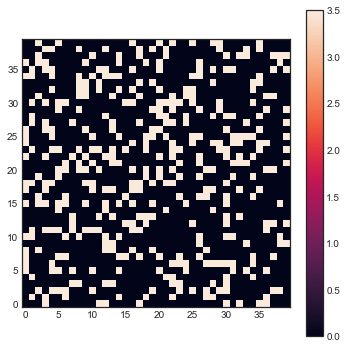

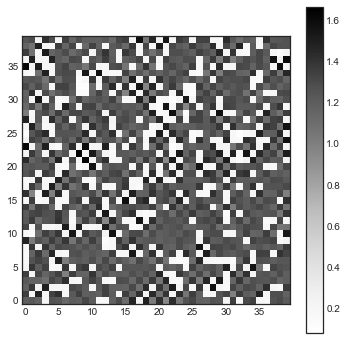

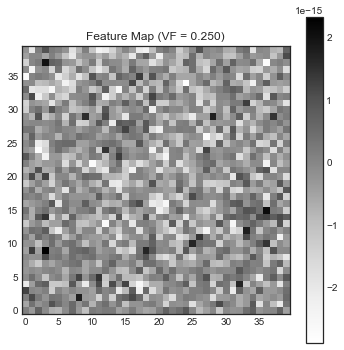

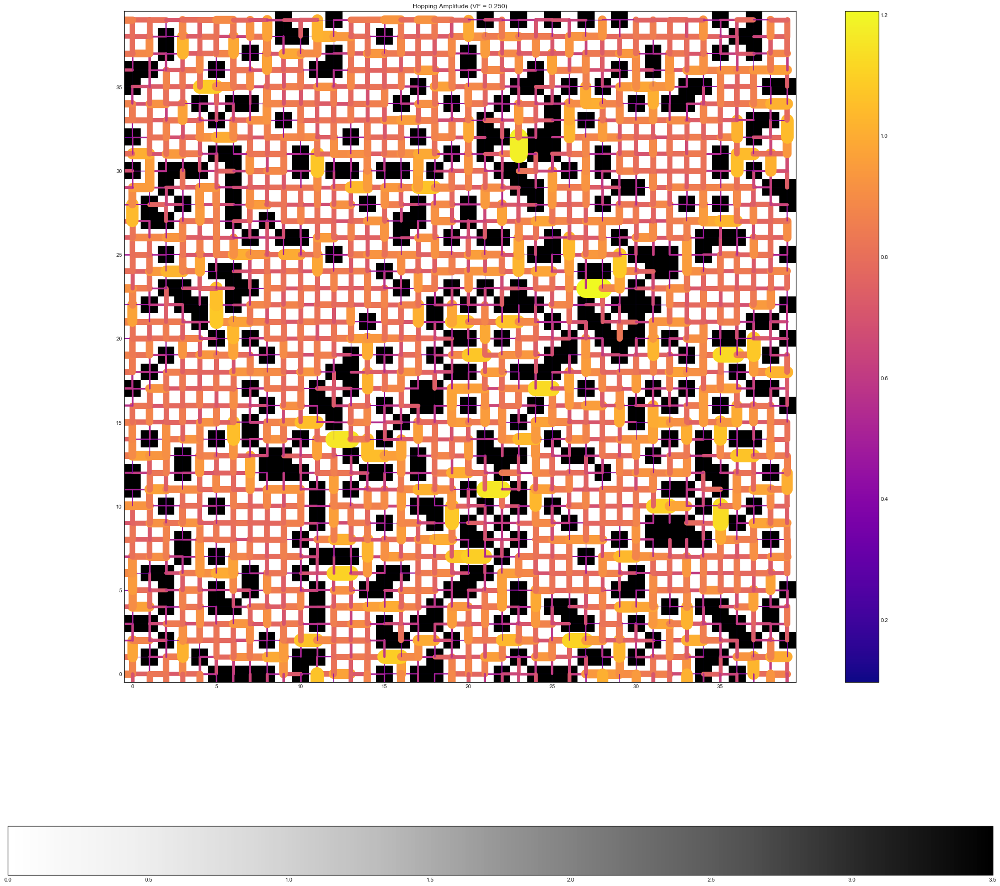

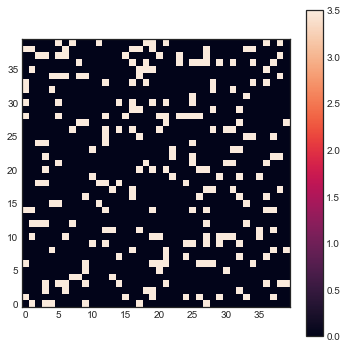

...

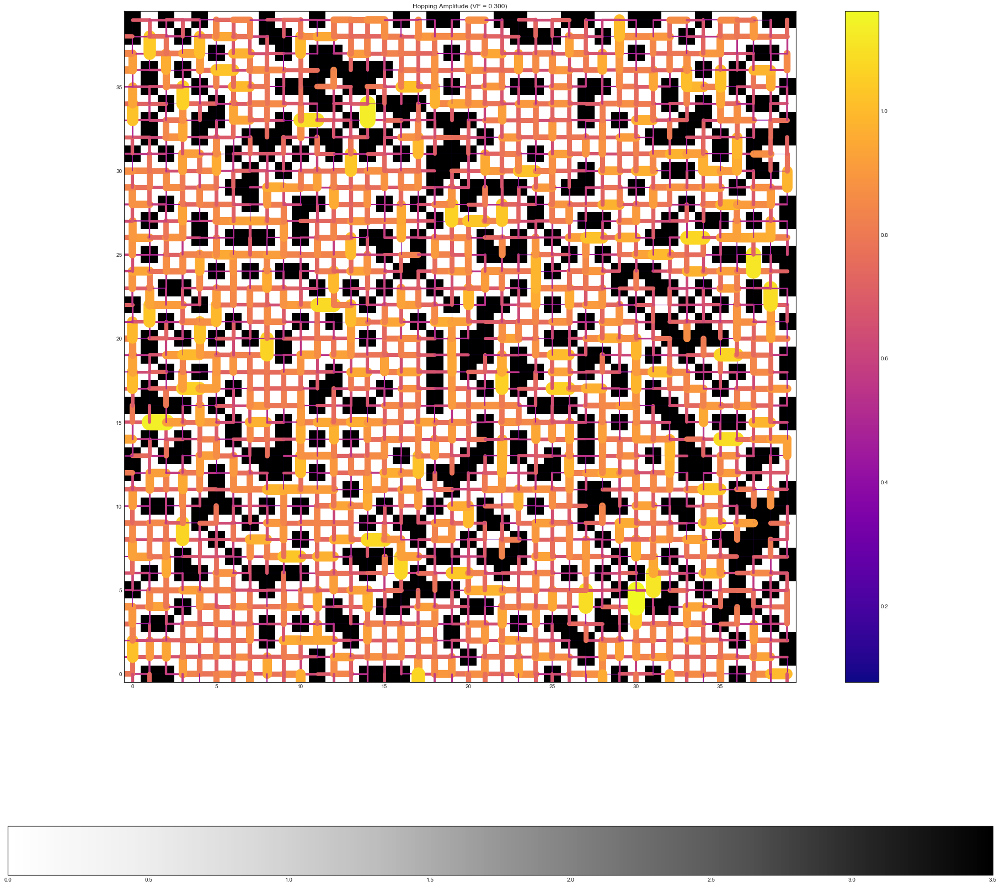

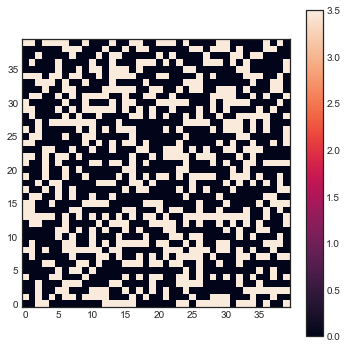

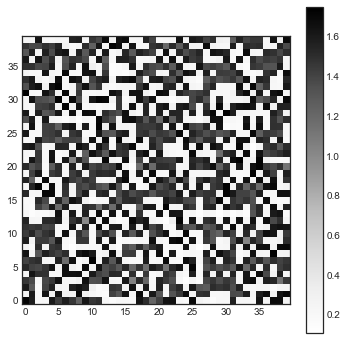

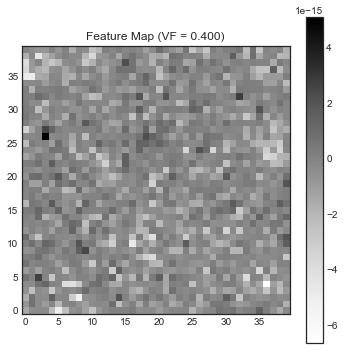

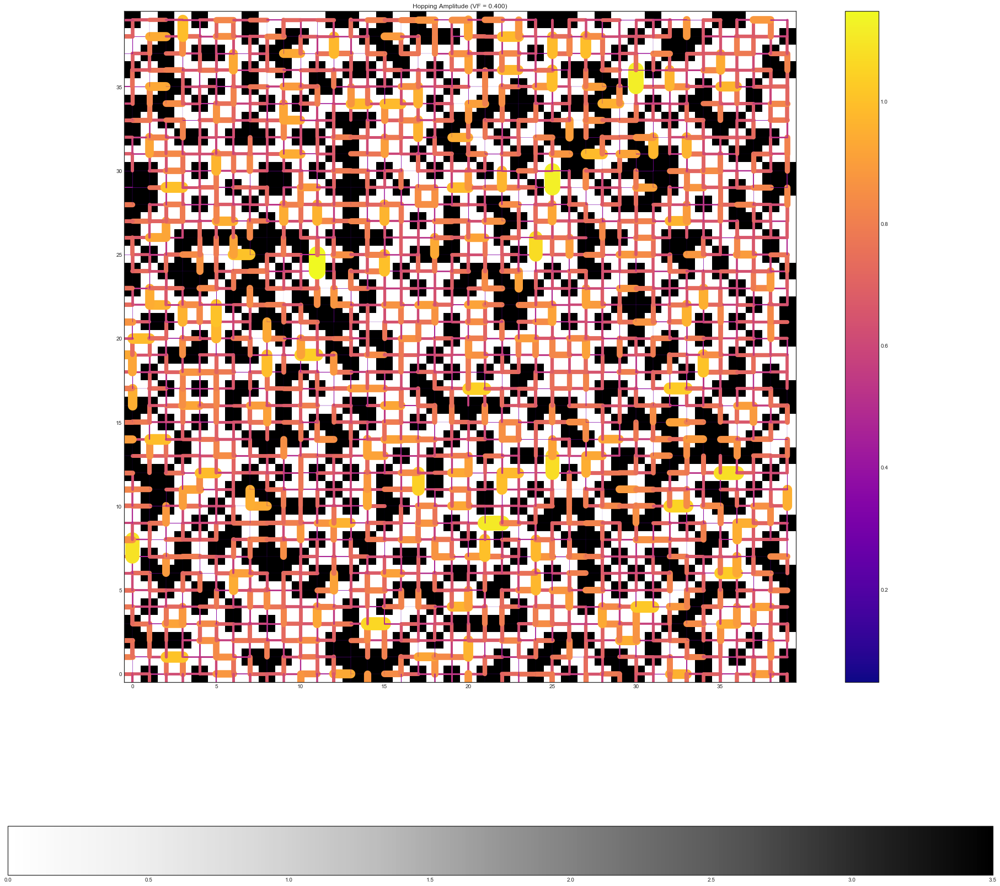

In [41]:
direct = '/Users/Sazbo/Desktop/toAnalyze/DisHB_toAnalyze/'
for files in glob.iglob(direct + '/DisHB_RUN1_*.fits'):
    files = os.path.basename(files);
    DisHB_ulist = pyfits.open(direct + files);
    #DisHB_ulist.info()
    susc = np.array( DisHB_ulist['DiamagneticSusceptibilityComp'].data )
    bonds = np.array( DisHB_ulist['HoppingBonds'].data )
    sites = np.array( DisHB_ulist['LatticeSiteOrdering'].data )
    temperature = float(DisHB_ulist['PRIMARY'].header['HUBBARD MODEL K_BT'])
    disorder_fraction = float(DisHB_ulist['PRIMARY'].header['HIERARCH HUBBARD MODEL V FRACTION'])
    sns.set_style('white')
    
    disorder_map = np.array( DisHB_ulist["OnSiteImpurityPotential"].data )
    spin_up_map = np.array(DisHB_ulist["FinalSpinUpMeanOccupancyMap"].data)
    spin_dn_map = np.array(DisHB_ulist["FinalSpinDownMeanOccupancyMap"].data)
    
    plt.figure(figsize=(6,6))
    plt.imshow(disorder_map.T, origin='lower', extent=[-0.5, 39.5, -0.5, 39.5])
    plt.colorbar()
    plt.figure(figsize=(6,6))
    plt.imshow((spin_up_map + spin_dn_map).T, origin='lower', extent=[-0.5, 39.5, -0.5, 39.5], cmap='Greys')
    plt.colorbar()
    plt.figure(figsize=(6,6))
    plt.imshow((spin_up_map - spin_dn_map).T, origin='lower', extent=[-0.5, 39.5, -0.5, 39.5], cmap='Greys')
    plt.colorbar()
    plt.title('Feature Map (VF = %1.3f)' %disorder_fraction)
    plt.show()
    
    total_susc = susc['DiamagneticSusceptibilityXUp'] + susc['DiamagneticSusceptibilityYUp'] + susc['DiamagneticSusceptibilityXDn'] + susc['DiamagneticSusceptibilityYDn'];
    
    maxchi = 1;
    #np.max(np.abs(diag_real1))

    fig = plt.figure(figsize=(32,32))
    ax = fig.add_subplot(1,1,1)
    im = ax.imshow(np.abs(disorder_map), origin='lower', extent=[-0.5, 39.5, -0.5, 39.5], cmap='Greys')
    fig.colorbar(im, orientation='horizontal')
    #ax.imshow(zg.T, origin='lower', extent=[-0.5, 40.5, -0.5, 40.5], cmap='Greys')
    
    cmap = plt.cm.plasma   
    cNorm  = colors.Normalize(vmin=np.min(np.abs(total_susc / maxchi)), vmax=np.max(np.abs(total_susc / maxchi)))
    scalarMap = cmx.ScalarMappable(norm=cNorm,cmap=cmap)

    scalarMap.set_array(np.abs(total_susc / maxchi))

    ax.set_xlim(-0.5, 39.5)
    ax.set_ylim(-0.5, 39.5)

    for b, chi in zip(bonds, total_susc):
        rowsite = b[0]-1
        colsite = b[1]-1
        vec = np.array([b[3], b[4]])
        rowsite_coord = np.array([sites[rowsite]['b1'], sites[rowsite]['b2']])
        colsite_coord = rowsite_coord + vec
        
        magnitude = np.abs(chi) / maxchi
        
        colorVal = scalarMap.to_rgba(magnitude)
        
        if chi < 0:
            rowsite_coord, colsite_coord = colsite_coord, rowsite_coord

        arrow_direction = 1.0 * (colsite_coord - rowsite_coord)
        arrow_start = rowsite_coord * 0.1 + colsite_coord * 0.9
        
        #print (arrow_start[0], arrow_start[1])
        ax.plot([rowsite_coord[0], colsite_coord[0]], 
                [rowsite_coord[1], colsite_coord[1]],
                linewidth=20.*magnitude**3,
                color=colorVal,
                )
        

    ax.set_title('Hopping Amplitude (VF = %1.3f)' %disorder_fraction)
    fig.colorbar(scalarMap)

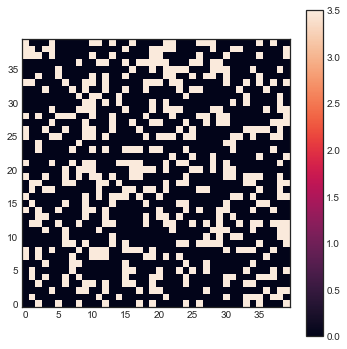

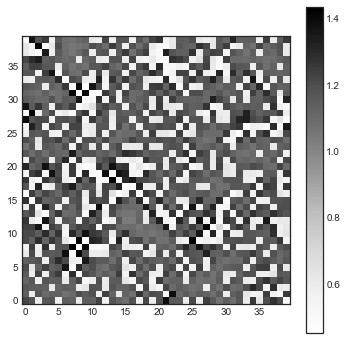

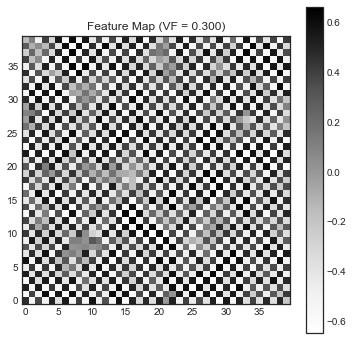

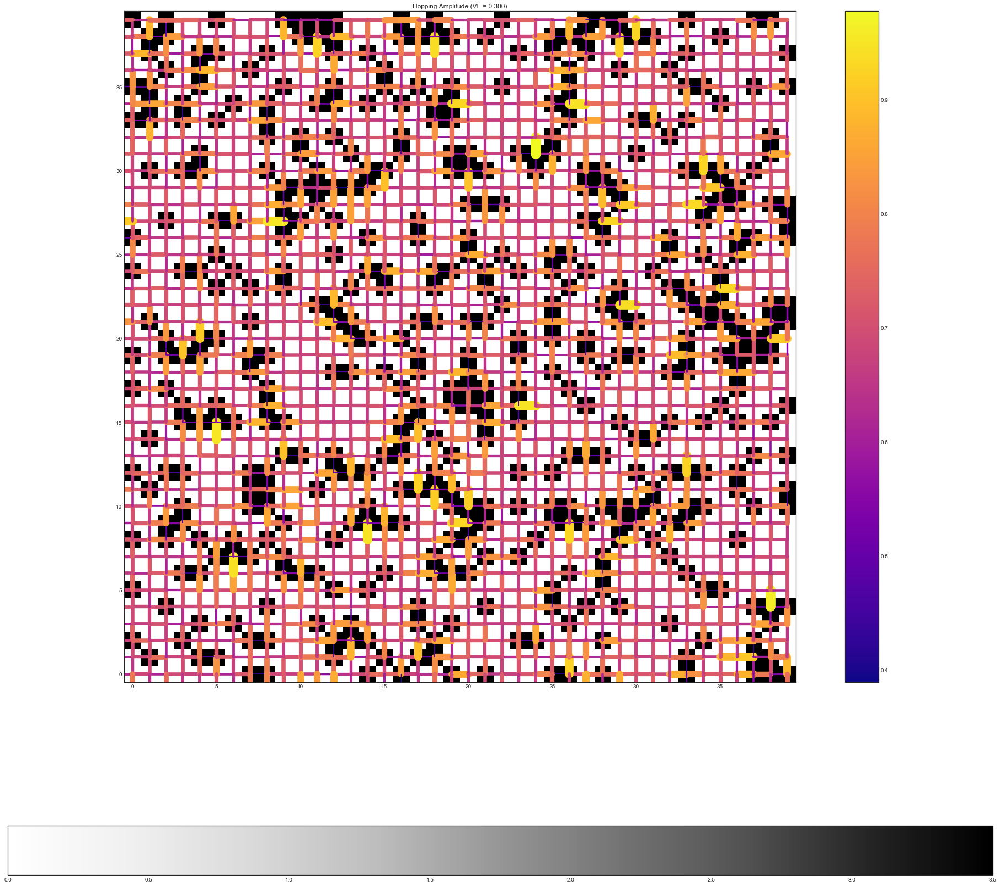

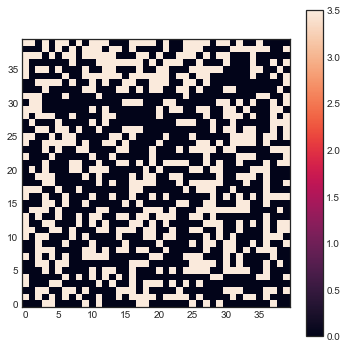

...

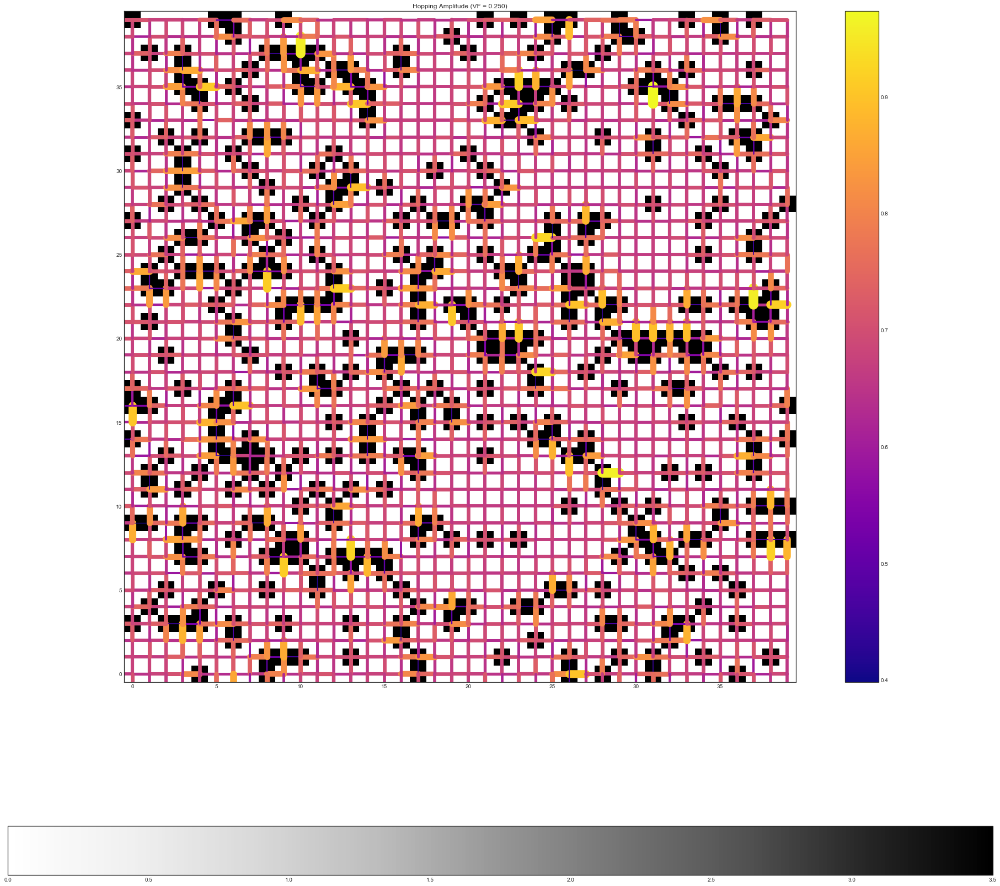

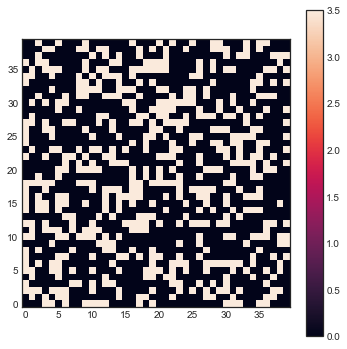

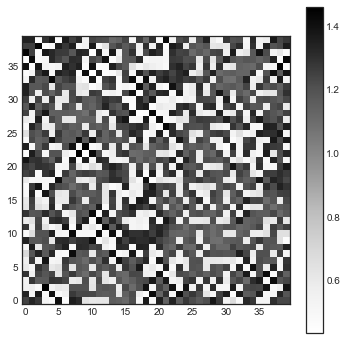

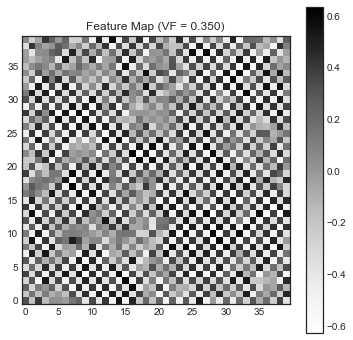

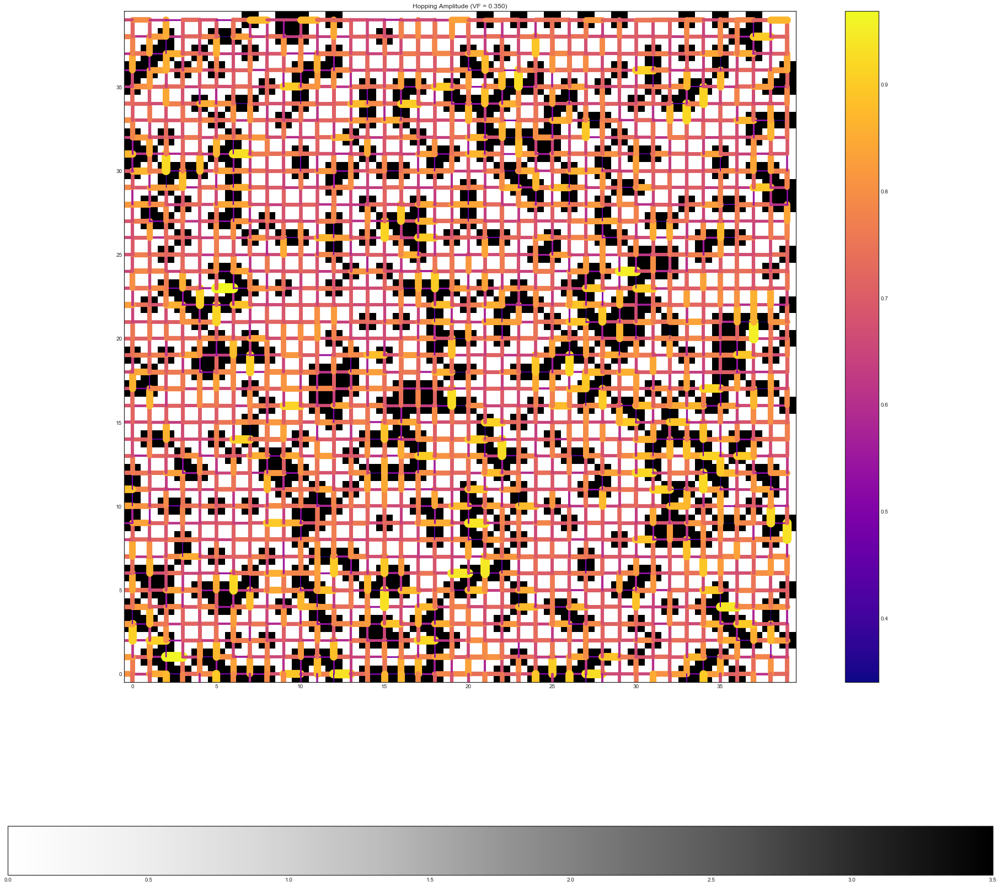

In [43]:
direct = '/Users/Sazbo/Desktop/toAnalyze/'
for files in glob.iglob(direct + '/VIDYA_FINAL_RUN39_*.fits'):
    files = os.path.basename(files);
    DisHB_ulist = pyfits.open(direct + files);
    #DisHB_ulist.info()
    susc = np.array( DisHB_ulist['DiamagneticSusceptibility'].data )
    bonds = np.array( DisHB_ulist['HoppingBonds'].data )
    sites = np.array( DisHB_ulist['LatticeSiteOrdering'].data )
    temperature = float(DisHB_ulist['PRIMARY'].header['HUBBARD MODEL K_BT'])
    disorder_fraction = float(DisHB_ulist['PRIMARY'].header['HIERARCH HUBBARD MODEL V FRACTION'])
    sns.set_style('white')
    
    disorder_map = np.array( DisHB_ulist["OnSiteImpurityPotential"].data )
    spin_up_map = np.array(DisHB_ulist["FinalSpinUpMeanOccupancyMap"].data)
    spin_dn_map = np.array(DisHB_ulist["FinalSpinDownMeanOccupancyMap"].data)
    
    plt.figure(figsize=(6,6))
    plt.imshow(disorder_map.T, origin='lower', extent=[-0.5, 39.5, -0.5, 39.5])
    plt.colorbar()
    plt.figure(figsize=(6,6))
    plt.imshow((spin_up_map + spin_dn_map).T, origin='lower', extent=[-0.5, 39.5, -0.5, 39.5], cmap='Greys')
    plt.colorbar()
    plt.figure(figsize=(6,6))
    plt.imshow((spin_up_map - spin_dn_map).T, origin='lower', extent=[-0.5, 39.5, -0.5, 39.5], cmap='Greys')
    plt.colorbar()
    plt.title('Feature Map (VF = %1.3f)' %disorder_fraction)
    plt.show()
    
    total_susc = susc['DiamagneticSusceptibilityXUp'] + susc['DiamagneticSusceptibilityYUp'] + susc['DiamagneticSusceptibilityXDn'] + susc['DiamagneticSusceptibilityYDn'];
    
    maxchi = 1;
    #np.max(np.abs(diag_real1))

    fig = plt.figure(figsize=(32,32))
    ax = fig.add_subplot(1,1,1)
    im = ax.imshow(np.abs(disorder_map), origin='lower', extent=[-0.5, 39.5, -0.5, 39.5], cmap='Greys')
    fig.colorbar(im, orientation='horizontal')
    #ax.imshow(zg.T, origin='lower', extent=[-0.5, 40.5, -0.5, 40.5], cmap='Greys')
    
    cmap = plt.cm.plasma   
    cNorm  = colors.Normalize(vmin=np.min(np.abs(total_susc / maxchi)), vmax=np.max(np.abs(total_susc / maxchi)))
    scalarMap = cmx.ScalarMappable(norm=cNorm,cmap=cmap)

    scalarMap.set_array(np.abs(total_susc / maxchi))

    ax.set_xlim(-0.5, 39.5)
    ax.set_ylim(-0.5, 39.5)

    for b, chi in zip(bonds, total_susc):
        rowsite = b[0]-1
        colsite = b[1]-1
        vec = np.array([b[3], b[4]])
        rowsite_coord = np.array([sites[rowsite]['b1'], sites[rowsite]['b2']])
        colsite_coord = rowsite_coord + vec
        
        magnitude = np.abs(chi) / maxchi
        
        colorVal = scalarMap.to_rgba(magnitude)
        
        if chi < 0:
            rowsite_coord, colsite_coord = colsite_coord, rowsite_coord

        arrow_direction = 1.0 * (colsite_coord - rowsite_coord)
        arrow_start = rowsite_coord * 0.1 + colsite_coord * 0.9
        
        #print (arrow_start[0], arrow_start[1])
        ax.plot([rowsite_coord[0], colsite_coord[0]], 
                [rowsite_coord[1], colsite_coord[1]],
                linewidth=20.*magnitude**3,
                color=colorVal,
                )
        

    ax.set_title('Hopping Amplitude (VF = %1.3f)' %disorder_fraction)
    fig.colorbar(scalarMap)

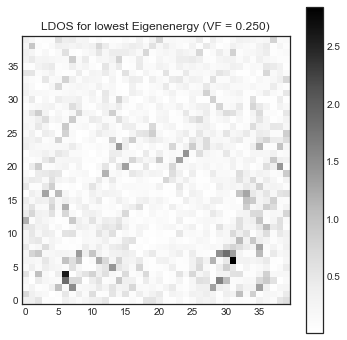

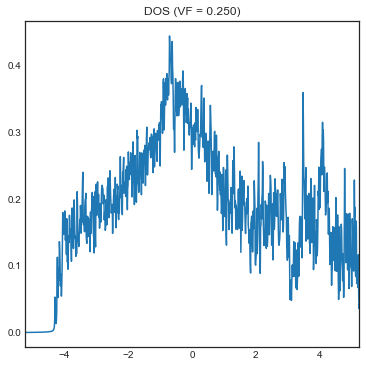

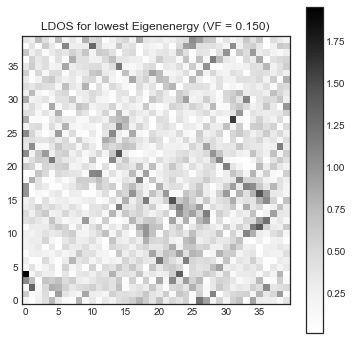

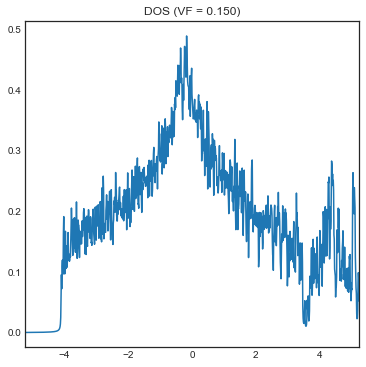

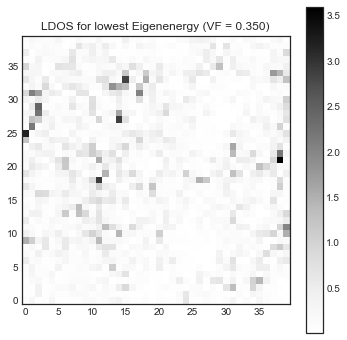

...

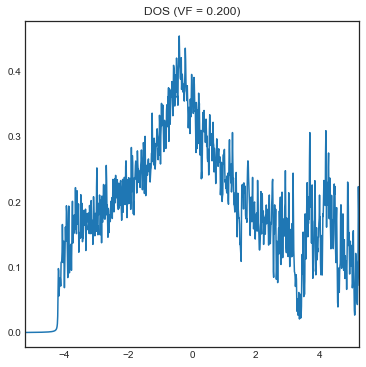

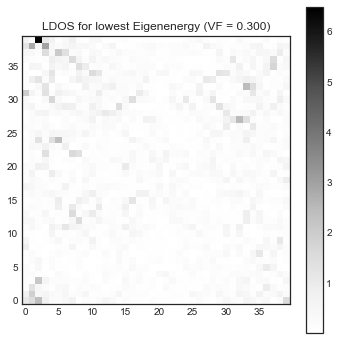

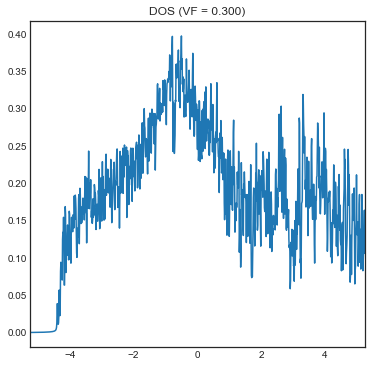

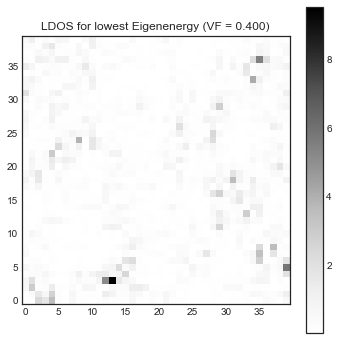

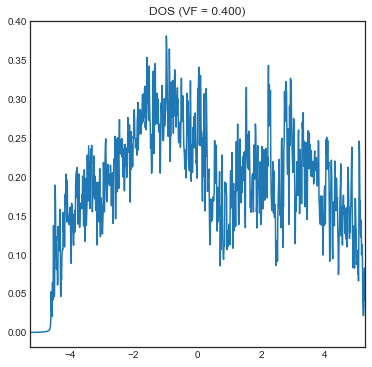

In [45]:
direct = '/Users/Sazbo/Desktop/toAnalyze/DisHB_toAnalyze/'
for files in glob.iglob(direct + '/DisHB_RUN1_*.fits'):
    files = os.path.basename(files);
    DisHB_ulist = pyfits.open(direct + files);
    #DisHB_ulist.info()
    susc = np.array( DisHB_ulist['DiamagneticSusceptibilityComp'].data )
    bonds = np.array( DisHB_ulist['HoppingBonds'].data )
    sites = np.array( DisHB_ulist['LatticeSiteOrdering'].data )
    temperature = float(DisHB_ulist['PRIMARY'].header['HUBBARD MODEL K_BT'])
    disorder_fraction = float(DisHB_ulist['PRIMARY'].header['HIERARCH HUBBARD MODEL V FRACTION'])
    density_of_states = np.array(DisHB_ulist['DOS_1'].data)
    idx = np.argmin( np.abs( density_of_states['omega']) )
    sns.set_style('white')
    
    zg = DisHB_ulist['LDOS_1'].data[idx,:,::-1]
    
    plt.figure(figsize=(6,6))
    plt.imshow(zg, origin='lower', extent=[-0.5, 39.5, -0.5, 39.5], cmap='Greys')
    plt.title('LDOS for lowest Eigenenergy (VF = %1.3f)' %disorder_fraction)
    plt.colorbar()
    
    plt.figure(figsize=(6,6))
    plt.plot(density_of_states['omega'], density_of_states['DOS'])
    plt.xlim(-5.25, 5.25)
    plt.title('DOS (VF = %1.3f)' %disorder_fraction)

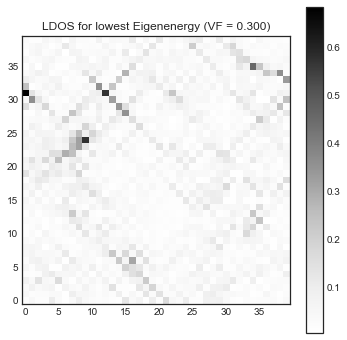

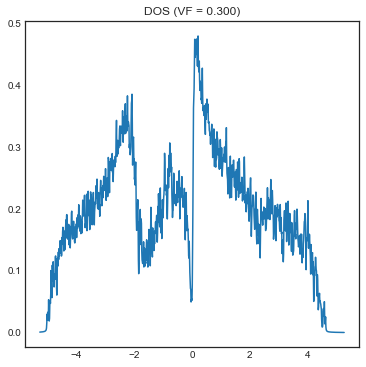

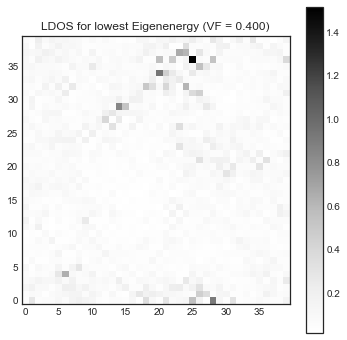

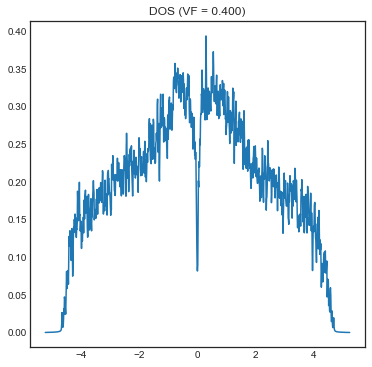

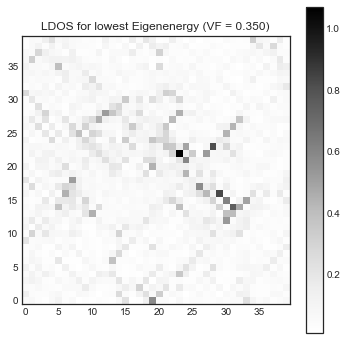

...

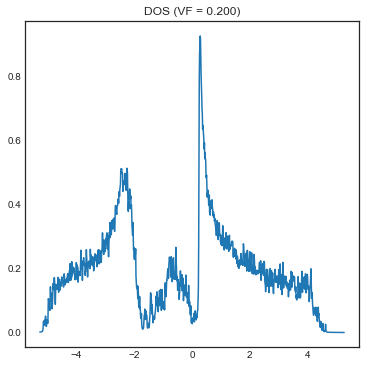

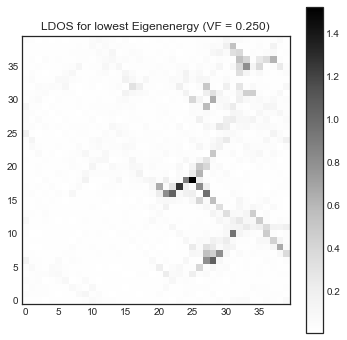

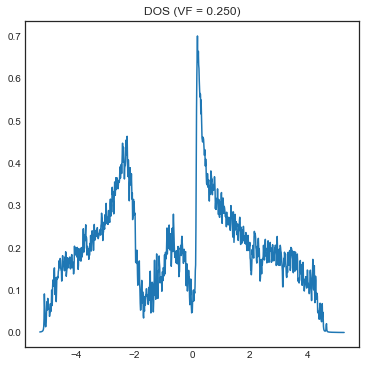

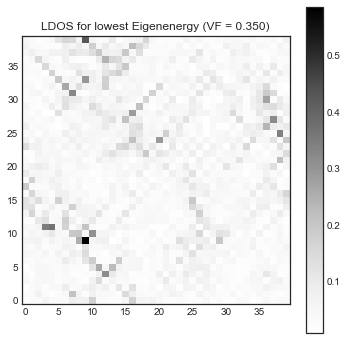

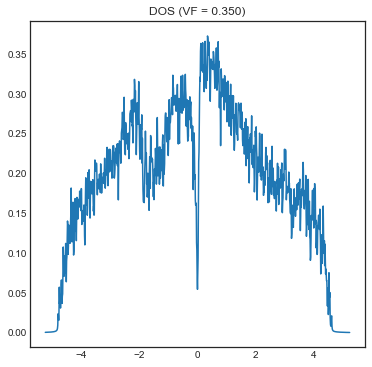

In [46]:
direct = '/Users/Sazbo/Desktop/toAnalyze/'
for files in glob.iglob(direct + '/*.fits'):
    files = os.path.basename(files);
    DisHB_ulist = pyfits.open(direct + files);
    #DisHB_ulist.info()
    susc = np.array( DisHB_ulist['DiamagneticSusceptibility'].data )
    bonds = np.array( DisHB_ulist['HoppingBonds'].data )
    sites = np.array( DisHB_ulist['LatticeSiteOrdering'].data )
    temperature = float(DisHB_ulist['PRIMARY'].header['HUBBARD MODEL K_BT'])
    disorder_fraction = float(DisHB_ulist['PRIMARY'].header['HIERARCH HUBBARD MODEL V FRACTION'])
    density_of_states = np.array(DisHB_ulist['DOS_1'].data)
    idx = np.argmin( np.abs( density_of_states['omega']) )
    sns.set_style('white')
    
    zg = DisHB_ulist['LDOS_1'].data[idx,:,::-1]
    
    plt.figure(figsize=(6,6))
    plt.imshow(zg, origin='lower', extent=[-0.5, 39.5, -0.5, 39.5], cmap='Greys')
    plt.title('LDOS for lowest Eigenenergy (VF = %1.3f)' %disorder_fraction)
    plt.colorbar()
    
    plt.figure(figsize=(6,6))
    plt.plot(density_of_states['omega'], density_of_states['DOS'])
    plt.title('DOS (VF = %1.3f)' %disorder_fraction)

In [103]:
hdulist35[0].header

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                   16 / number of bits per data pixel                  
NAXIS   =                    0 / number of data axes                            
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
HIERARCH LATTICE BASIS1 X ANGS = 1.000000E+00 / X-component of first unit cell b
HIERARCH LATTICE BASIS1 Y ANGS = 0.000000E+00 / Y-component of first unit cell b
HIERARCH LATTICE BASIS2 X ANGS = 0.000000E+00 / X-component of second unit cell 
HIERARCH LATTICE BASIS2 Y ANGS = 1.000000E+00 / Y-component of second unit cell 
HIERARCH LATTICE NSITES B1 = 40 / Number of lattice sites along b1              
HIERARCH LATTICE NSITES B2 = 40 / Number of lattice sites along b2              
HIERARCH LATTICE NSITES TOTA

In [104]:
cd ../..

/


In [105]:
cd Users/Sazbo/Desktop/Trivedi_Group/ungodly/gen_init_fits/

/Users/Sazbo/Desktop/Trivedi_Group/ungodly/gen_init_fits


In [119]:
hdulist_8 = pyfits.open("DisHB_RUN8_1.33333333333_0017.fits")
hdulist_8[0].header

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                   16 / number of bits per data pixel                  
NAXIS   =                    0 / number of data axes                            
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
HIERARCH LATTICE BASIS1 X ANGS = 1.000000E+00 / X-component of first unit cell b
HIERARCH LATTICE BASIS1 Y ANGS = 0.000000E+00 / Y-component of first unit cell b
HIERARCH LATTICE BASIS2 X ANGS = 0.000000E+00 / X-component of second unit cell 
HIERARCH LATTICE BASIS2 Y ANGS = 1.000000E+00 / Y-component of second unit cell 
HIERARCH LATTICE NSITES B1 = 20 / Number of lattice sites along b1              
HIERARCH LATTICE NSITES B2 = 20 / Number of lattice sites along b2              
HIERARCH LATTICE NSITES TOTA

In [5]:
parax = para_susc['ParamagneticSusceptibilityXUp'] + para_susc['ParamagneticSusceptibilityXDn'];
paray = para_susc['ParamagneticSusceptibilityYUp'] + para_susc['ParamagneticSusceptibilityYDn'];

/Users/Sazbo/Desktop/toAnalyze/toAnalyze


In [32]:
hdulist = pyfits.open('VIDYA_FINAL_RUN39_0335_35VF_r.fits')

In [33]:
columns_name = ['Disorder','OMEGA', 'Para_Susc_XX_Real','Para_Susc_XX_Imag', 'Local_Occupation'];

full_dict = {};

direct = '.'
i = 3;

dF = pd.DataFrame(columns=columns_name)


for files in glob.iglob(direct + '/VIDYA_FINAL_RUN39_0'):
    hdulist = pyfits.open(files)
    i = 28
    

Filename: VIDYA_FINAL_RUN39_0335_35VF_r.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      95   ()      
  1  LDOS_1        1 ImageHDU        18   (40, 40, 1001)   float64   
  2  DOS_1         1 BinTableHDU     22   1001R x 2C   [D, D]   
  3  FinalPsiDownEigenstates_Real    1 ImageHDU         9   (40, 40, 3200)   float64   
  4  FinalPsiDownEigenstates_Imag    1 ImageHDU         9   (40, 40, 3200)   float64   
  5  FinalEigenvalues    1 BinTableHDU     12   3200R x 1C   [D]   
  6  FinalPsiUpEigenstates_Real    1 ImageHDU         9   (40, 40, 3200)   float64   
  7  FinalPsiUpEigenstates_Imag    1 ImageHDU         9   (40, 40, 3200)   float64   
  8  FinalSpinFlipMap_Imag    1 ImageHDU         8   (40, 40)   float64   
  9  FinalSpinFlipMap_Real    1 ImageHDU         8   (40, 40)   float64   
 10  FinalSpinDownMeanOccupancyMap    1 ImageHDU         8   (40, 40)   float64   
 11  FinalSpinUpMeanOccupancyMap    1 ImageHDU         8  

In [40]:
hdulist[30].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                   64 / length of dimension 1                          
NAXIS2  =                 3200 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                    4 / number of table fields                         
HIERARCH PIPELINE CGS OMEGA = 0.2 / input/output frequency                      
HIERARCH PIPELINE CGS ETA = 0.01 / intrinsic broadening                         
HIERARCH PIPELINE CGS PROGRAM NAME = 'paramagnetic.py' / Name of simulation prog
HIERARCH PIPELINE CGS PROGRAM VERSION = '1.0.0   ' / Version of simulation progr
HIERARCH PIPELINE CGS PROGRA

In [43]:
np.imag(para2['ParamagneticSusceptibilityXDn'])

array([  2.16520068e-05,   1.25171051e-05,  -5.20370374e-05, ...,
         8.55091544e-05,   4.69986528e-05,   2.38451572e-05])

In [58]:
cd ~/Desktop/

/Users/Sazbo/Desktop


In [66]:
hdulist = pyfits.open('DisHB_disint_COND_28_0_0017.fits')

In [67]:
hdulist.info()
hdulist[23].header

Filename: DisHB_disint_COND_28_0_0017.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      95   ()      
  1  FinalPsiDownEigenstates_Real    1 ImageHDU         9   (28, 28, 1568)   float64   
  2  FinalPsiDownEigenstates_Imag    1 ImageHDU         9   (28, 28, 1568)   float64   
  3  FinalEigenvalues    1 BinTableHDU     12   1568R x 1C   [D]   
  4  FinalPsiUpEigenstates_Real    1 ImageHDU         9   (28, 28, 1568)   float64   
  5  FinalPsiUpEigenstates_Imag    1 ImageHDU         9   (28, 28, 1568)   float64   
  6  FinalSpinFlipMap_Imag    1 ImageHDU         8   (28, 28)   float64   
  7  FinalSpinFlipMap_Real    1 ImageHDU         8   (28, 28)   float64   
  8  FinalSpinDownMeanOccupancyMap    1 ImageHDU         8   (28, 28)   float64   
  9  FinalSpinUpMeanOccupancyMap    1 ImageHDU         8   (28, 28)   float64   
 10  TrialSpinFlipMap_Imag    1 ImageHDU         8   (28, 28)   float64   
 11  TrialSpinFlipMap_Real    1 ImageHD

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                   64 / length of dimension 1                          
NAXIS2  =                 1568 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                    4 / number of table fields                         
HIERARCH PIPELINE CGS PROGRAM NAME = 'cgs.py  ' / Name of simulation program    
HIERARCH PIPELINE CGS PROGRAM VERSION = '1.0.0   ' / Version of simulation progr
HIERARCH PIPELINE CGS PROGRAM GIT VERSION = 'unknown ' / Git version hash of sim
HIERARCH PIPELINE EXEC TIME = '2018-09-10T18:51PM on September 10, 2018' / Time 
EXTNAME = 'DiamagneticSuscep

In [68]:
hdulist[24].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                   64 / length of dimension 1                          
NAXIS2  =                 1568 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                    4 / number of table fields                         
HIERARCH PIPELINE CGS OMEGA = 0.05 / input/output frequency                     
HIERARCH PIPELINE CGS ETA = 0.01 / intrinsic broadening                         
HIERARCH PIPELINE CGS PROGRAM NAME = 'cgs.py  ' / Name of simulation program    
HIERARCH PIPELINE CGS PROGRAM VERSION = '1.0.0   ' / Version of simulation progr
HIERARCH PIPELINE CGS PROGRA